In [1]:
import pandas as pd
import numpy as np
import nibabel as nib
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl

(np.float64(-0.5), np.float64(255.5), np.float64(0.5), np.float64(-0.5))

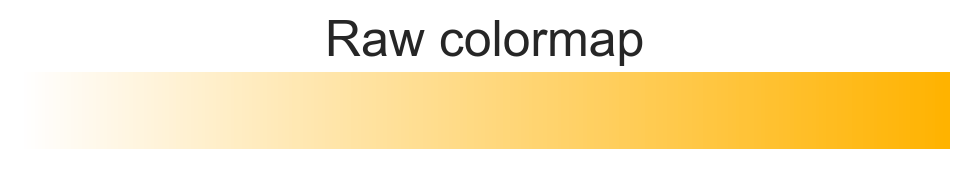

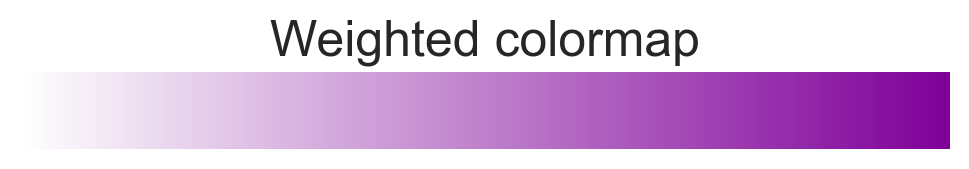

In [2]:
# ── Global visualisation configuration ──────────────────────────────────────

# 1.  General Matplotlib defaults
# ── Global visualisation configuration ──────────────────────────────────────
import matplotlib as mpl
import seaborn as sns

mpl.rcParams.update(
    {
        # ── Canvas size & resolution ───────────────────────────────────────────
        # Default figure size: 12×8 inches  →  4800×3200 px when exported at 400 dpi
        "figure.figsize": (12, 8),
        "figure.dpi": 200,  # crisp in-notebook / retina preview
        "savefig.dpi": 400,  # print-quality PNG/PDF
        # ── Fonts ──────────────────────────────────────────────────────────────
        "font.family": "sans-serif",
        "font.sans-serif": ["Roboto", "DejaVu Sans", "Arial"],
        "axes.titlesize": 24,
        # "axes.titleweight": "bold",
        "axes.labelsize": 24,
        "xtick.labelsize": 14,
        "ytick.labelsize": 14,
        "legend.fontsize": 20,
        # ── Axis & spine aesthetics ────────────────────────────────────────────
        "axes.spines.top": False,
        "axes.spines.right": False,
        "axes.spines.left": True,
        "axes.spines.bottom": True,
        "axes.linewidth": 1,
        "axes.grid": True,
        "grid.color": "#E6E6E6",
        "grid.linewidth": 0.4,
        "grid.alpha": 0.8,
        # ── Colour cycle (colour-blind-safe) ───────────────────────────────────
        "axes.prop_cycle": mpl.cycler(color=sns.color_palette("Set2")),
        # ── Figure background ─────────────────────────────────────────────────
        "figure.facecolor": "white",
    }
)

# Seaborn theme inherits the rcParams above
sns.set_theme(context="talk", style="whitegrid", palette="Set2")


# 2.  Seaborn theme (inherits Matplotlib rcParams)
sns.set_theme(
    context="talk",  # slightly larger fonts for presentations / papers
    style="whitegrid",  # grid only on y-axis (good for histograms)
    palette="Set2",  # matches the rcParams colour cycle
)


# 3.  Helper function for consistent figure export
def savefig_nice(fig, filename, *, tight=True, dpi=300, **savefig_kwargs):
    """Save figure with tight layout and correct DPI."""
    if tight:
        fig.tight_layout()
    fig.savefig(filename, dpi=dpi, bbox_inches="tight", transparent=True, **savefig_kwargs)


# 4.  Colour constants for this project (optional convenience)
# COL_RAW = "#1f77b4"  # e.g. unweighted sample
COL_RAW = "#ffb300"
# COL_WEIGHTED = "#d62728"  # weighted sample
COL_WEIGHTED = "#7F0099CE"  # weighted sample
COL_REF = "0.25"  # census reference (neutral grey)
COL_CENSUS = "#A5A5A5"

# generate colormaps from white to colour
COL_WHITE = "white"
COL_RAW_RGB = mpl.colors.to_rgb(COL_RAW)
COL_WEIGHTED_RGB = mpl.colors.to_rgb(COL_WEIGHTED)
CMAP_RAW = mpl.colors.LinearSegmentedColormap.from_list(
    "raw", [COL_WHITE, COL_RAW_RGB], N=256
)
CMAP_WEIGHTED = mpl.colors.LinearSegmentedColormap.from_list(
    "weighted", [COL_WHITE, COL_WEIGHTED_RGB], N=256
)
# visualize the colormaps
# if __name__ == "__main__":
fig, ax = plt.subplots(figsize=(6, 0.5))
ax.imshow(np.linspace(0, 1, 256)[None, :], aspect="auto", cmap=CMAP_RAW)
ax.set_title("Raw colormap")
ax.axis("off")
# savefig_nice(fig, "colormap_raw.png")

fig, ax = plt.subplots(figsize=(6, 0.5))
ax.imshow(np.linspace(0, 1, 256)[None, :], aspect="auto", cmap=CMAP_WEIGHTED)
ax.set_title("Weighted colormap")
ax.axis("off")
# savefig_nice(fig, "colormap_weighted.png")

In [3]:
ATLAS = "schaefer2018tian2020_400_7"
region_col = "index"
# Load important files
DATA_DIR = Path("/home/galkepler/Projects/neuroaging/data")

# Output directory for figures
OUTPUT_DIR = Path("/home/galkepler/Projects/neuroaging/figures/fig4")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

# Load the data
parcels = pd.read_csv(DATA_DIR / "external" / "atlases" / ATLAS / "parcels.csv", index_col=0)
nifti = DATA_DIR / "external" / "atlases" / ATLAS / "atlas.nii.gz"
nifti_matlab = DATA_DIR / "external" / "atlases" / ATLAS / "atlas_matlab.nii"

In [4]:
metrics = ["gm_vol", "wm_vol","csf_vol", "adc", "fa", "ad", "rd"]
distribution_metric = "qfmean"

bad_subjects = ["IN120120"]

# Load the data
data = {}
for metric in metrics:
    data[metric] = pd.read_csv(DATA_DIR / "processed" / f"{metric}.csv", index_col=0).reset_index(
        drop=True
    )
    # drop problematic subjects
    data[metric] = data[metric][~data[metric]["subject_code"].isin(bad_subjects)]
    data[metric]["sex"] = data[metric]["sex"].map({"M": 0, "F": 1})


# data["age_squared"] = data["age_at_scan"] ** 2

/tmp/ipykernel_9888/2856015696.py:9: DtypeWarning: Columns (1,7,61) have mixed types. Specify dtype option on import or set low_memory=False.
  data[metric] = pd.read_csv(DATA_DIR / "processed" / f"{metric}.csv", index_col=0).reset_index(
/tmp/ipykernel_9888/2856015696.py:9: DtypeWarning: Columns (1,7,61) have mixed types. Specify dtype option on import or set low_memory=False.
  data[metric] = pd.read_csv(DATA_DIR / "processed" / f"{metric}.csv", index_col=0).reset_index(
/tmp/ipykernel_9888/2856015696.py:9: DtypeWarning: Columns (1,7,61) have mixed types. Specify dtype option on import or set low_memory=False.
  data[metric] = pd.read_csv(DATA_DIR / "processed" / f"{metric}.csv", index_col=0).reset_index(
/tmp/ipykernel_9888/2856015696.py:9: DtypeWarning: Columns (16,22,23,26) have mixed types. Specify dtype option on import or set low_memory=False.
  data[metric] = pd.read_csv(DATA_DIR / "processed" / f"{metric}.csv", index_col=0).reset_index(
/tmp/ipykernel_9888/2856015696.py:9: Dt

In [5]:
metric_cols = {
    metric: "volume" if "vol" in metric else distribution_metric for metric in metrics
}

for m, df in data.items():
    df = df.rename(columns={metric_cols[m]: "value"})
    data[m] = df

In [6]:
israel_population = pd.read_csv(DATA_DIR / "processed" / "israel_population.csv")

In [7]:
import numpy as np
import pandas as pd


# ─────────────────────────────────────────────────────────────────────────────
def compute_poststrat_weights(
    sample_df: pd.DataFrame,
    pop_df: pd.DataFrame,
    *,
    age_col: str = "age_at_scan",
    start_col: str = "range_start",
    end_col: str = "range_end",
    pop_total_col: str = "total",
    cap: float | None = None,
    return_bin_table: bool = False,
):
    """
    Post-stratification weights so that the age distribution of *sample_df*
    matches an external population distribution supplied in *pop_df*.

    Parameters
    ----------
    sample_df : DataFrame with an ``age_col`` column (years; int or float).
    pop_df    : DataFrame with columns
                    [start_col, end_col, pop_total_col].
                * Values in ``pop_total_col`` can be counts **or** percentages
                  (they are internally re-scaled to proportions).
                * The row order doesn’t matter; they will be sorted.
    cap       : Optional float.  If provided, weights are truncated at
                ``cap × mean(weight)`` and then re-scaled so mean(weight)=1.
    return_bin_table : If True, also return a DataFrame summarising
                       n_sample, n_pop, and weight_factor for every bin.

    Returns
    -------
    weights   : 1-D numpy array aligned with ``sample_df.index``.
    bin_table : (optional) tidy per-bin summary (see above).
    """

    # 1 ── tidy & validate the population table --------------------------------
    pop = (
        pop_df[[start_col, end_col, pop_total_col]]
        .dropna()
        .astype({start_col: int, end_col: int, pop_total_col: float})
        .sort_values(start_col)  # your CSV is descending; fix that
        .reset_index(drop=True)
    )

    if (pop[end_col] <= pop[start_col]).any():
        raise ValueError("Each range_end must exceed range_start.")

    if (pop[start_col].iloc[1:].values < pop[end_col].iloc[:-1].values).any():
        overlap = pop.iloc[
            np.where(pop[start_col].iloc[1:].values < pop[end_col].iloc[:-1].values)[0] + 1
        ][[start_col, end_col]]
        raise ValueError(
            "Age bins overlap (rows shown below) — "
            "merge / correct them before weighting:\n"
            f"{overlap}"
        )

    # 2 ── build right-inclusive bin edges  (···| s_i  …  e_i | s_{i+1} …) ----
    edges = pop[start_col].tolist() + [pop[end_col].iloc[-1]]

    # 3 ── assign every participant to a bin -----------------------------------
    s_bins = pd.cut(
        sample_df[age_col],
        bins=edges,
        right=True,
        include_lowest=True,
        labels=pop.index,  # categorical labels 0,1,…
    )

    # 4 ── compute *sample* and *population* proportions per bin --------------
    n_sample = s_bins.value_counts(sort=False).sort_index()
    prop_sample = n_sample / n_sample.sum()

    prop_pop = pop[pop_total_col] / pop[pop_total_col].sum()

    # 5 ── weight factor = pop_prop / sample_prop ------------------------------
    weight_factor = prop_pop / prop_sample.replace(0, np.nan)  # avoid /0 → NaN

    # 6 ── map factor back to each row ----------------------------------------
    w = s_bins.map(weight_factor).astype(float).to_numpy()
    w = np.where(np.isnan(w), 0.0, w)  # rows that fell outside bins → 0

    # 7 ── optional weight truncation (winsorisation) --------------------------
    if cap is not None and cap > 0:
        mean_pos = w[w > 0].mean()
        w = np.clip(w, 0, cap * mean_pos)

    # 8 ── re-scale so mean(weight > 0) == 1 -----------------------------------
    positive = w > 0
    w[positive] = w[positive] / w[positive].mean()

    # 9 ── return --------------------------------------------------------------
    if return_bin_table:
        bin_tbl = pd.DataFrame(
            {
                "n_sample": n_sample,
                "n_pop": prop_pop * n_sample.sum(),  # rescaled to sample size
                "prop_sample": prop_sample,
                "prop_pop": prop_pop,
                "weight_factor": weight_factor,
            }
        )
        return w, bin_tbl

    return w

In [8]:
# assign weights
for metric in metrics:
    data[metric]["weight"], _ = compute_poststrat_weights(
        data[metric],
        israel_population,
        age_col="age_at_scan",
        cap=None,  # try None first; if still spiky, use 4 or 5
        return_bin_table=True,
    )
    data[metric]["subject_code"] = data[metric]["subject_code"].astype(str).str.zfill(4)

In [9]:
# df_long = data["adc"].copy()
# df_long[df_long["subject_code"] == 447]["subject_code"]

In [10]:
import pandas as pd
from functools import reduce


def long_to_wide(
    long_df,
    *,
    index="subject_code",
    columns=region_col,
    values="value",
):
    """Pivot a long metric table → wide DataFrame (subjects × regions)."""
    wide = long_df.pivot_table(index=index, columns=columns, values=values, aggfunc="first")
    # Optional: drop regions with >20 % missing values
    thresh = int(0.8 * len(wide))
    wide = wide.dropna(axis=1, thresh=thresh)
    # Optional: drop subejcts with >20 % missing values
    thresh = int(0.8 * len(parcels))
    wide = wide.dropna(axis=0, thresh=thresh)
    return wide


def prep_metric_matrices(metric_dict, *, index="subject_code"):
    """
    Parameters
    ----------
    metric_dict : {metric_name: long_df}
        Each DataFrame must include `subject_id`, `region`, `value`,
        `age_at_scan`, and any covariates you want.
    Returns
    -------
    X_dict : {metric_name: ndarray}
             Wide feature matrices aligned on the *intersection* of subjects.
    y, w, cov_df : Series / ndarray
             Age, weights, and any extra covariates for the same subjects.
    """
    # 1.  Convert every long → wide
    wide_dict = {m: long_to_wide(df) for m, df in metric_dict.items()}

    # 2.  Intersect subject index across all metrics
    common_subs = reduce(pd.Index.intersection, [w.index for w in wide_dict.values()])

    # 3.  Slice & order every matrix
    for m in wide_dict:
        wide_dict[m] = wide_dict[m].loc[common_subs]

    # 4.  Pull y, w, covariates from *any* of the long dfs (they all duplicate)
    ref_long = next(iter(metric_dict.values()))
    ref_meta = (
        ref_long.drop_duplicates(subset=index)  # one row per subject
        .set_index(index)
        .loc[common_subs]
    )
    y = ref_meta["age_at_scan"]
    w = ref_meta.get("weight", pd.Series(1.0, index=common_subs))
    cov = ref_meta[ref_meta.columns.difference(["age_at_scan", "weight"])]

    # 5.  Convert features to numpy (sklearn ready)
    X_dict = {m: wide.to_numpy() for m, wide in wide_dict.items()}
    return X_dict, y.to_numpy(), w.to_numpy(), cov

In [11]:
# -------------------------------------------------------
# Build (X, y, w, cov) once, re-use in every metric loop
# -------------------------------------------------------
X_dict, y, w, cov = prep_metric_matrices(data)
# y_mean = y.mean()
# y = y - y_mean  # center the target variable
# Example list of covariates you want to *keep* (z-scored later if needed)
cov_names = {
    m: ["sex"] if "vol" not in m else ["sex", "tiv"] for m in metrics
}  # e.g. ["sex", "tiv"]

In [12]:
import numpy as np
import pandas as pd
from pathlib import Path
from typing import Union
from sklearn.base import BaseEstimator
from sklearn.model_selection import BaseCrossValidator
import statsmodels.api as sm
from statsmodels.formula.api import ols
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures


def cross_val_predict_with_posthoc(
    model: BaseEstimator,
    X: Union[np.ndarray, pd.DataFrame],
    y: np.ndarray,
    w: np.ndarray,
    cv: BaseCrossValidator,
    *,
    use_weights: bool = True,
    post_hoc_degree: int = 1,
) -> np.ndarray:
    """
    Cross-validated predictions with OPTIONAL linear / polynomial
    post-hoc bias-correction (fit on training residuals only).

    Parameters
    ----------
    model            : any scikit-learn regressor or pipeline
    X                : shape (n_samples, n_features)
    y                : shape (n_samples,) – chronological age
    w                : sample weights, shape (n_samples,)
    cv               : cross-validator providing (train_idx, test_idx)
    use_weights      : if False, sample weights are ignored
    post_hoc_degree  : 0 ⇒ no correction; 1 ⇒ linear; 2 ⇒ quadratic …

    Returns
    -------
    y_pred_corr      : bias-corrected out-of-fold predictions
    """

    # ensure array-like indexing works
    X_arr = X.values if isinstance(X, pd.DataFrame) else X
    y = np.asarray(y)
    w = np.asarray(w)

    y_oof = np.full_like(y, np.nan, dtype=float)

    original_residuals = np.full_like(y, np.nan, dtype=float)
    corrected_residuals = np.full_like(y, np.nan, dtype=float)

    for all_train_idx, test_idx in cv.split(X_arr, y):
        train_idx, val_idx = train_test_split(all_train_idx, test_size=0.2, random_state=42)
        X_tr, X_te, X_val = X_arr[train_idx], X_arr[test_idx], X_arr[val_idx]
        y_tr, y_te, y_val = y[train_idx], y[test_idx], y[val_idx]
        w_tr = w[train_idx]
        w_val = w[val_idx]

        # ---------------- fit base model -----------------------------
        fit_kwargs = {"estimator__sample_weight": w_tr} if use_weights else {}
        model.fit(X_tr, y_tr, **fit_kwargs)

        # ---------------- predict on test fold -----------------------
        y_pred_te = model.predict(X_te)
        y_pred_val = model.predict(X_val)
        y_pred_tr = model.predict(X_tr)
        # ---------------- optional post-hoc bias ---------------------
        if post_hoc_degree > 0:
            orig_resid_te = y_te - y_pred_te
            lin = LinearRegression()
            if post_hoc_degree > 1:
                poly = PolynomialFeatures(degree=post_hoc_degree)
                resid_model = Pipeline([("poly", poly), ("lin", lin)])
            else:
                resid_model = Pipeline([("lin", lin)])
            fit_kwargs = {"lin__sample_weight": w_val} if use_weights else {}
            resid_model.fit(y_val.reshape(-1, 1), y_val - y_pred_val)
            # a, b = lin.intercept_, lin.coef_[0]
            # y_pred_te = (y_pred_te - a) / b
            y_pred_te = y_pred_te + resid_model.predict(y_pred_te.reshape(-1, 1))
            original_residuals[test_idx] = orig_resid_te
            corrected_residuals[test_idx] = y_te - y_pred_te
            # resid_tr = y_tr - model.predict(X_tr)
            # coeffs = np.polyfit(y_pred_tr, resid_tr, post_hoc_degree)
            # bias_fn = np.poly1d(coeffs)
            # orig_resid_te = y_te - y_pred_te
            # te_bias = bias_fn(y_pred_te)
            # y_pred_te = y_pred_te + te_bias
            # original_residuals[test_idx] = orig_resid_te
            # corrected_residuals[test_idx] = y_te - y_pred_te

        y_oof[test_idx] = y_pred_te

    return y_oof, original_residuals, corrected_residuals

In [13]:
import numpy as np
import pandas as pd
from pathlib import Path
from typing import Union
from sklearn.base import BaseEstimator
from sklearn.model_selection import BaseCrossValidator
import statsmodels.api as sm  # Not strictly needed here, LinearRegression is sufficient
from statsmodels.formula.api import ols  # Not strictly needed here
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline  # Make sure this is imported!


def cross_val_predict_with_de_lange_beheshti(
    model: BaseEstimator,
    X: Union[np.ndarray, pd.DataFrame],
    y: np.ndarray,
    w: np.ndarray,
    cv: BaseCrossValidator,
    *,
    use_weights: bool = True,
    # post_hoc_degree is not directly applicable in this exact formulation
    # but could be adapted if you regress y_actual on poly(y_predicted)
) -> np.ndarray:
    """
    Cross-validated predictions with post-hoc de Lange/Beheshti-style
    linear bias-correction (fit on training residuals only).

    Parameters
    ----------
    model            : any scikit-learn regressor or pipeline
    X                : shape (n_samples, n_features)
    y                : shape (n_samples,) – chronological age
    w                : sample weights, shape (n_samples,)
    cv               : cross-validator providing (train_idx, test_idx)
    use_weights      : if False, sample weights are ignored

    Returns
    -------
    y_pred_corr      : bias-corrected out-of-fold predictions
    original_residuals : uncorrected residuals (actual - predicted)
    corrected_residuals : corrected residuals (actual - corrected_predicted)
    """

    # ensure array-like indexing works
    X_arr = X.values if isinstance(X, pd.DataFrame) else X
    y = np.asarray(y)
    w = np.asarray(w)

    y_oof = np.full_like(y, np.nan, dtype=float)
    original_residuals = np.full_like(y, np.nan, dtype=float)
    corrected_residuals = np.full_like(y, np.nan, dtype=float)

    for all_train_idx, test_idx in cv.split(X_arr, y):
        # Nested split for training base model and fitting bias correction
        train_idx, val_idx = train_test_split(all_train_idx, test_size=0.2, random_state=42)
        X_tr, X_te, X_val = X_arr[train_idx], X_arr[test_idx], X_arr[val_idx]
        y_tr, y_te, y_val = y[train_idx], y[test_idx], y[val_idx]
        w_tr = w[train_idx]
        w_val = w[val_idx]

        # ---------------- fit base model -----------------------------
        fit_kwargs = {"sample_weight": w_tr} if use_weights else {}
        # If 'model' is a pipeline, use 'estimator__sample_weight' or appropriate step name
        if isinstance(model, Pipeline):
            fit_kwargs = {model.steps[-1][0] + "__sample_weight": w_tr} if use_weights else {}
        model.fit(X_tr, y_tr, **fit_kwargs)

        # ---------------- predict on test and validation folds -----------------------
        y_pred_te_original = model.predict(X_te)
        y_pred_val = model.predict(X_val)

        # ---------------- Post-hoc de Lange/Beheshti bias correction ---------------
        # Fit a linear model: y_actual = a + b * y_predicted
        bias_corrector = LinearRegression()
        # Reshape y_pred_val for single feature input to LinearRegression
        fit_kwargs_bias = {"sample_weight": w_val} if use_weights else {}
        bias_corrector.fit(y_pred_val.reshape(-1, 1), y_val, **fit_kwargs_bias)

        alpha = bias_corrector.intercept_
        beta = bias_corrector.coef_[0]

        # Apply correction: y_corrected = (y_predicted - alpha) / beta
        # This transforms the predicted age to follow the identity line with actual age
        # on average across the age range.
        if beta != 0:  # Avoid division by zero
            y_pred_te_corrected = (y_pred_te_original - alpha) / beta
        else:  # Fallback if beta is zero (unlikely with real data but for robustness)
            y_pred_te_corrected = y_pred_te_original  # No effective correction

        # Store results
        y_oof[test_idx] = y_pred_te_corrected
        original_residuals[test_idx] = y_te - y_pred_te_original
        corrected_residuals[test_idx] = y_te - y_pred_te_corrected

    return y_oof, original_residuals, corrected_residuals

In [14]:
import numpy as np
import pandas as pd
from typing import Union
from sklearn.base import BaseEstimator
from sklearn.model_selection import BaseCrossValidator
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline  # Make sure this is imported for PolynomialFeatures usage


def cross_val_predict_with_bias_correction(
    model: BaseEstimator,
    X: Union[np.ndarray, pd.DataFrame],
    y_chronological: np.ndarray,  # y in paper's notation
    w: np.ndarray,
    cv: BaseCrossValidator,
    *,
    use_weights: bool = True,
    post_hoc_degree: int = 0,  # 0 = no correction, 1 = linear de Lange/Beheshti, >1 = polynomial residual correction
) -> tuple[np.ndarray, np.ndarray, np.ndarray]:
    """
    Cross-validated predictions with optional post-hoc bias-correction.

    Parameters
    ----------
    model            : any scikit-learn regressor or pipeline
    X                : shape (n_samples, n_features)
    y_chronological  : shape (n_samples,) – chronological age (y in paper's notation)
    w                : sample weights, shape (n_samples,)
    cv               : cross-validator providing (train_idx, test_idx)
    use_weights      : if False, sample weights are ignored
    post_hoc_degree  : int
                       0 = no bias correction applied.
                       1 = linear de Lange et al. / Beheshti-style correction (fit x=a*y+b, correct (x-b)/a).
                       >1 = polynomial residual correction (fit residuals as poly of predicted_age, add to prediction).

    Returns
    -------
    y_pred_corr      : bias-corrected out-of-fold predictions
    original_residuals : uncorrected residuals (chronological_age - original_predicted_age)
    corrected_residuals : corrected residuals (chronological_age - corrected_predicted_age)
    """

    # Ensure array-like indexing works
    X_arr = X.values if isinstance(X, pd.DataFrame) else X
    y_chronological = np.asarray(y_chronological)
    w = np.asarray(w)

    y_oof_corrected = np.full_like(y_chronological, np.nan, dtype=float)
    original_residuals = np.full_like(y_chronological, np.nan, dtype=float)
    corrected_residuals = np.full_like(y_chronological, np.nan, dtype=float)

    for all_train_idx, test_idx in cv.split(X_arr, y_chronological):
        # Nested split for training base model and fitting bias correction model
        train_idx, val_idx = train_test_split(all_train_idx, test_size=0.2, random_state=42)

        X_tr, X_te, X_val = X_arr[train_idx], X_arr[test_idx], X_arr[val_idx]
        y_tr, y_te, y_val = (
            y_chronological[train_idx],
            y_chronological[test_idx],
            y_chronological[val_idx],
        )
        w_tr = w[train_idx]
        w_val = w[val_idx]

        # ---------------- Fit base model -----------------------------
        fit_kwargs = {"sample_weight": w_tr} if use_weights else {}
        if isinstance(model, Pipeline):
            fit_kwargs = {model.steps[-1][0] + "__sample_weight": w_tr} if use_weights else {}
        model.fit(X_tr, y_tr, **fit_kwargs)

        # ---------------- Predict on test and validation folds -----------------------
        y_pred_te_original = model.predict(X_te)
        y_pred_val = model.predict(X_val)

        # ---------------- Post-hoc bias correction (conditional on post_hoc_degree) ---------------
        if post_hoc_degree > 0:
            if post_hoc_degree == 1:
                # --- Linear de Lange et al. / Beheshti-style correction ---
                # Fit a linear model: x = a*y + b
                # Where x is predicted_age (y_pred_val) and y is chronological_age (y_val)
                bias_corrector = LinearRegression()
                # fit_kwargs_bias = {"sample_weight": w_val} if use_weights else {}
                fit_kwargs_bias = {}
                # Fit: y_pred_val (dependent) on y_val (independent)
                bias_corrector.fit(y_val.reshape(-1, 1), y_pred_val, **fit_kwargs_bias)

                a_coeff = bias_corrector.coef_[0]  # This is 'a' from x = a*y + b
                b_intercept = bias_corrector.intercept_  # This is 'b' from x = a*y + b

                # Apply correction: x_corrected = (x - b) / a
                if a_coeff != 0:  # Avoid division by zero
                    y_pred_te_corrected = (y_pred_te_original - b_intercept) / a_coeff
                else:
                    y_pred_te_corrected = (
                        y_pred_te_original  # No effective correction if no linear relationship
                    )
            else:  # post_hoc_degree > 1
                # --- Polynomial Residual Correction (your original approach) ---
                # Fit residuals (y_val - y_pred_val) as a polynomial function of predicted_age (y_pred_val)
                poly = PolynomialFeatures(degree=post_hoc_degree)
                lin = LinearRegression()

                # Create a pipeline for the residual model: poly features of predicted age -> linear regression
                resid_model_pipeline = Pipeline([("poly", poly), ("lin", lin)])

                # Fit the residual model on validation data
                # Independent variable: y_pred_val (predicted age on validation set)
                # Dependent variable: y_val - y_pred_val (residuals on validation set)
                # fit_kwargs_resid_model = {"lin__sample_weight": w_val} if use_weights else {}
                fit_kwargs_resid_model = {}
                resid_model_pipeline.fit(
                    y_pred_val.reshape(-1, 1), y_val - y_pred_val, **fit_kwargs_resid_model
                )

                # Predict the bias component for the test set using its original predictions
                bias_component_te = resid_model_pipeline.predict(y_pred_te_original.reshape(-1, 1))

                # Add the predicted bias component to the original predictions
                y_pred_te_corrected = y_pred_te_original + bias_component_te
        else:  # post_hoc_degree == 0, no correction
            y_pred_te_corrected = y_pred_te_original

        # Store results
        y_oof_corrected[test_idx] = y_pred_te_corrected
        original_residuals[test_idx] = y_te - y_pred_te_original
        corrected_residuals[test_idx] = y_te - y_pred_te_corrected

    return y_oof_corrected, original_residuals, corrected_residuals

In [15]:
import numpy as np
from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, get_scorer
from sklearn.utils.validation import check_is_fitted

class BiasCorrectedRegressor(RegressorMixin, BaseEstimator):
    """
    A customizable regressor that estimates corrected brain age following the recommendations
    from Smith et al. (2019), without the SVD dimensionality reduction to keep original features.
    
    Parameters:
    - base_estimator: The estimator for initial brain age prediction (default: LinearRegression(fit_intercept=False)).
      Can be any regressor compatible with scikit-learn interface.
    - scorer: str or callable, default='r2'
      The scoring function to use in the score method. Can be a string (e.g., 'r2', 'neg_mean_absolute_error')
      supported by sklearn.metrics.get_scorer, or a custom callable that takes (y_true, y_pred).
    - apply_correction: bool, default=True
      If True, apply the bias correction. If False, perform no correction and behave like the base_estimator
      (after centering), ignoring y_chron in predict and using raw predictions in score.
    """
    def __init__(self, base_estimator=LinearRegression(fit_intercept=False), scorer='r2', apply_correction=True):
        self.base_estimator = base_estimator
        if isinstance(scorer, str):
            self.scorer = get_scorer(scorer)
        else:
            self.scorer = scorer
        self.apply_correction = apply_correction
    
    def fit(self, X, y, sample_weight=None):
        # Handle sample_weight for internal models
        if sample_weight is None:
            sample_weight = np.ones(len(y))
        if not self.apply_correction:
            # If no correction is applied, fit the base estimator directly
            self.base_estimator.fit(X, y, sample_weight=sample_weight)
            return self
        # Step 3: Subtract means from Y and all columns in X
        # Weighted mean for Y
        self.mean_Y_ = np.average(y)
        Y_d = y - self.mean_Y_
        
        # Weighted mean for each column in X
        self.mean_X_ = np.average(X, axis=0)
        X_d = X - self.mean_X_
        
        # Step 7: Initial model Y_B_1 = X β_1 + δ_1
        self.initial_model_ = self.base_estimator
        if hasattr(self.initial_model_, 'fit') and 'sample_weight' in self.initial_model_.fit.__code__.co_varnames:
            self.initial_model_.fit(X_d, Y_d, sample_weight=sample_weight)
        else:
            self.initial_model_.fit(X_d, Y_d)
        
        if not self.apply_correction:
            return self
        
        # Compute Y_B_1 (demeaned)
        Y_B_d = self.initial_model_.predict(X_d)
        
        # Compute initial delta_1 = Y_B_1 - Y (demeaned)
        delta1 = Y_B_d - Y_d
        
        # Step 5: Compute Y^2, demean it (weighted)
        Y2 = Y_d ** 2
        self.mean_Y2_ = np.average(Y2)
        Y2_d = Y2 - self.mean_Y2_
        
        # Orthogonalize Y2_d with respect to Y_d
        self.ortho_reg_ = LinearRegression(fit_intercept=False)
        self.ortho_reg_.fit(Y_d.reshape(-1, 1), Y2_d, sample_weight=sample_weight)
        proj = self.ortho_reg_.predict(Y_d.reshape(-1, 1))
        Y2_o = Y2_d - proj
        
        # Step 6: Create matrix Y2 = [Y_d, Y2_o]
        Y2_mat = np.column_stack((Y_d, Y2_o))
        
        # Step 8: Corrected model δ_1 = Y2 β_2 + δ_2_q
        self.bias_model_ = LinearRegression(fit_intercept=False)
        self.bias_model_.fit(Y2_mat, delta1, sample_weight=sample_weight)
        
        return self
    
    def predict(self, X, y_chron=None):
        """
        Predict brain ages.
        
        The 'y_chron' is the chronological age for the prediction samples (equivalent to Y for new data).
        It is required for bias correction because the correction term depends on the chronological age
        to account for linear and quadratic biases. If not provided, returns raw (uncorrected) brain ages.
        
        Parameters:
        - X: Features for prediction.
        - y_chron: Optional chronological ages for the samples (same as original Y but for new data).
        
        Returns:
        - Brain age predictions (corrected if y_chron provided, else raw).
        """
        if not self.apply_correction and y_chron is None:
            # If no correction is applied and no y_chron provided, return raw predictions
            return self.base_estimator.predict(X)
        check_is_fitted(self)
        
        # Demean X using training means
        X_d = X - self.mean_X_
        
        # Raw predicted brain age (demeaned prediction + mean_Y)
        Y_B_d = self.initial_model_.predict(X_d)
        Y_B = Y_B_d + self.mean_Y_
        
        if not self.apply_correction or y_chron is None:
            # Return raw predicted brain ages if no correction or no y_chron
            return Y_B
        
        # Compute corrected brain ages if y_chron provided and correction is applied
        y_d = y_chron - self.mean_Y_
        
        # Compute y2, demean using training mean_Y2_
        y2 = y_d ** 2
        y2_d = y2 - self.mean_Y2_
        
        # Orthogonalize y2_d with respect to y_d using training ortho_reg_
        proj = self.ortho_reg_.predict(y_d.reshape(-1, 1))
        y2_o = y2_d - proj
        
        # Create Y2_mat for test
        Y2_mat = np.column_stack((y_d, y2_o))
        
        # Compute correction term
        correction = self.bias_model_.predict(Y2_mat)
        
        # Corrected brain age = raw_brain_age - correction
        corrected_brain_age = Y_B - correction
        
        return corrected_brain_age
    
    def score(self, X, y):
        """
        Return the score using corrected predictions and the specified scorer.
        Requires y (chronological ages) for correction.
        """
        if not self.apply_correction:
            raw_preds = self.predict(X)
            return self.scorer(y, raw_preds)
        else:
            corrected_preds = self.predict(X, y_chron=y)
            return self.scorer(y, corrected_preds)

In [ ]:
import numpy as np
from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, get_scorer
from sklearn.utils.validation import check_is_fitted

class BiasCorrectedRegressor(RegressorMixin, BaseEstimator):
    """
    A customizable regressor that estimates corrected brain age following the recommendations
    from Smith et al. (2019), without the SVD dimensionality reduction to keep original features.
    
    Parameters:
    - base_estimator: The estimator for initial brain age prediction (default: LinearRegression(fit_intercept=False)).
      Can be any regressor compatible with scikit-learn interface.
    - scorer: str or callable, default='r2'
      The scoring function to use in the score method. Can be a string (e.g., 'r2', 'neg_mean_absolute_error')
      supported by sklearn.metrics.get_scorer, or a custom callable that takes (y_true, y_pred).
    - apply_correction: bool, default=True
      If True, apply the bias correction. If False, perform no correction and behave like the base_estimator
      (after centering), ignoring y_chron in predict and using raw predictions in score.
    """
    def __init__(self, base_estimator=LinearRegression(fit_intercept=False), scorer='r2', apply_correction=True):
        self.base_estimator = base_estimator
        if isinstance(scorer, str):
            self.scorer = get_scorer(scorer)
        else:
            self.scorer = scorer
        self.apply_correction = apply_correction
    
    def fit(self, X, y, sample_weight=None):
        # Handle sample_weight for internal models
        if sample_weight is None:
            sample_weight = np.ones(len(y))
        if not self.apply_correction:
            # If no correction is applied, fit the base estimator directly
            self.base_estimator.fit(X, y, sample_weight=sample_weight)
            return self
        # Step 3: Subtract means from Y and all columns in X
        # Weighted mean for Y
        self.mean_Y_ = np.average(y)
        Y_d = y - self.mean_Y_
        
        # Weighted mean for each column in X
        self.mean_X_ = np.average(X, axis=0)
        X_d = X - self.mean_X_
        
        # Step 7: Initial model Y_B_1 = X β_1 + δ_1
        self.initial_model_ = self.base_estimator
        if hasattr(self.initial_model_, 'fit') and 'sample_weight' in self.initial_model_.fit.__code__.co_varnames:
            self.initial_model_.fit(X_d, Y_d, sample_weight=sample_weight)
        else:
            self.initial_model_.fit(X_d, Y_d)
        
        if not self.apply_correction:
            return self
        
        # Compute Y_B_1 (demeaned)
        Y_B_d = self.initial_model_.predict(X_d)
        
        # Compute initial delta_1 = Y_B_1 - Y (demeaned)
        delta1 = Y_B_d - Y_d
        
        # Step 5: Compute Y^2, demean it (weighted)
        Y2 = Y_d ** 2
        self.mean_Y2_ = np.average(Y2)
        Y2_d = Y2 - self.mean_Y2_
        
        # Orthogonalize Y2_d with respect to Y_d
        self.ortho_reg_ = LinearRegression(fit_intercept=False)
        self.ortho_reg_.fit(Y_d.reshape(-1, 1), Y2_d, sample_weight=sample_weight)
        proj = self.ortho_reg_.predict(Y_d.reshape(-1, 1))
        Y2_o = Y2_d - proj
        
        # Step 6: Create matrix Y2 = [Y_d, Y2_o]
        Y2_mat = np.column_stack((Y_d, Y2_o))
        
        # Step 8: Corrected model δ_1 = Y2 β_2 + δ_2_q
        self.bias_model_ = LinearRegression(fit_intercept=False)
        self.bias_model_.fit(Y2_mat, delta1, sample_weight=sample_weight)
        
        return self
    
    def predict(self, X, y_chron=None):
        """
        Predict brain ages.
        
        The 'y_chron' is the chronological age for the prediction samples (equivalent to Y for new data).
        It is required for bias correction because the correction term depends on the chronological age
        to account for linear and quadratic biases. If not provided, returns raw (uncorrected) brain ages.
        
        Parameters:
        - X: Features for prediction.
        - y_chron: Optional chronological ages for the samples (same as original Y but for new data).
        
        Returns:
        - Brain age predictions (corrected if y_chron provided, else raw).
        """
        if not self.apply_correction and y_chron is None:
            # If no correction is applied and no y_chron provided, return raw predictions
            return self.base_estimator.predict(X)
        check_is_fitted(self)
        
        # Demean X using training means
        X_d = X - self.mean_X_
        
        # Raw predicted brain age (demeaned prediction + mean_Y)
        Y_B_d = self.initial_model_.predict(X_d)
        Y_B = Y_B_d + self.mean_Y_
        
        if not self.apply_correction or y_chron is None:
            # Return raw predicted brain ages if no correction or no y_chron
            return Y_B
        
        # Compute corrected brain ages if y_chron provided and correction is applied
        y_d = y_chron - self.mean_Y_
        
        # Compute y2, demean using training mean_Y2_
        y2 = y_d ** 2
        y2_d = y2 - self.mean_Y2_
        
        # Orthogonalize y2_d with respect to y_d using training ortho_reg_
        proj = self.ortho_reg_.predict(y_d.reshape(-1, 1))
        y2_o = y2_d - proj
        
        # Create Y2_mat for test
        Y2_mat = np.column_stack((y_d, y2_o))
        
        # Compute correction term
        correction = self.bias_model_.predict(Y2_mat)
        
        # Corrected brain age = raw_brain_age - correction
        corrected_brain_age = Y_B - correction
        
        return corrected_brain_age
    
    def score(self, X, y):
        """
        Return the score using corrected predictions and the specified scorer.
        Requires y (chronological ages) for correction.
        """
        if not self.apply_correction:
            raw_preds = self.predict(X)
            return self.scorer(y, raw_preds)
        else:
            corrected_preds = self.predict(X, y_chron=y)
            return self.scorer(y, corrected_preds)

In [16]:
from sklearn.base import clone
import numpy as np

def manual_cross_val_predict(model, X, y, cv, sample_weight=None, apply_correction=True):
    """
    Perform manual cross-validation predictions to get out-of-fold (OOF) predictions.
    
    This clones and fits the model on each train fold, then predicts on the val fold.
    If apply_correction is True, uses y_chron=y_val for corrected predictions.
    
    Parameters:
    - model: The pipeline or estimator to use (must have fit and predict methods).
    - X: Features (array-like).
    - y: Targets/chronological ages (array-like).
    - cv: Cross-validation splitter (e.g., KFold instance).
    - sample_weight: Optional sample weights (array-like).
    - apply_correction: Bool, if True, apply bias correction (requires y_chron).
    
    Returns:
    - oof_preds: Array of OOF predictions (same length as y).
    """
    oof_preds = np.zeros(len(y))
    
    for train_idx, val_idx in cv.split(X):
        pipeline_clone = clone(model)
        X_train, X_val = X[train_idx], X[val_idx]
        y_train, y_val = y[train_idx], y[val_idx]
        
        fit_params = {}
        if sample_weight is not None:
            w_train = sample_weight[train_idx]
            fit_params['estimator__sample_weight'] = w_train
        
        pipeline_clone.fit(X_train, y_train, **fit_params)
        
        if apply_correction:
            oof_preds[val_idx] = pipeline_clone.predict(X_val, y_chron=y_val)
        else:
            oof_preds[val_idx] = pipeline_clone.predict(X_val)
    
    return oof_preds

In [17]:
import numpy as np, pandas as pd
from sklearn.linear_model import RidgeCV, ElasticNetCV, LassoCV

# xgb
from sklearn.ensemble import GradientBoostingRegressor, HistGradientBoostingRegressor
from sklearn.preprocessing import FunctionTransformer
from sklearn.model_selection import KFold, cross_val_predict
from sklearn.metrics import r2_score, mean_absolute_error, root_mean_squared_error
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

alphas = np.logspace(-3, 4, 30)  # ridge λ grid

outer_cv = KFold(
    n_splits=5,
    shuffle=True,
    random_state=1,
)

demean = FunctionTransformer(
    func=lambda x: x - np.mean(x, axis=0),
    validate=False,
    check_inverse=False,
)

metric = "gm_vol"
X = X_dict[metric]

weighting_predictions = {}
weighting_rows = []

estimator = RidgeCV(
    # l1_ratio=[0, 0.5, 0.9, 1.0],
    alphas=alphas,
    # max_iter=int(1e6),
    scoring="neg_mean_absolute_error",
)

# estimator = ElasticNetCV(
#     # l1_ratio=[0, 0.5, 0.9, 1.0],
#     alphas=alphas,
#     l1_ratio=[0.2, 0.5, 0.9, 1.0],  # l1_ratio grid
#     max_iter=int(1e6),
#     # scoring="neg_mean_absolute_error",
# )
scaler = StandardScaler()
# estimator = HistGradientBoostingRegressor(
#     max_iter=1000,
#     max_depth=3,
# )

for [apply_correction, use_weights, key] in [
    (False, False, "baseline"),
    (False, True, "weighted"),
    (True, False, "linear_ph"),
    (True, True, "combined"),
]:
    # Optionally concatenate covariates
    covariates = cov_names[metric]
    if cov_names:
        X_model = np.hstack([X, cov[covariates].to_numpy()])
    else:
        X_model = X

    cur_estimator = BiasCorrectedRegressor(
        base_estimator=estimator,
        apply_correction=apply_correction,
        # post_hoc_correction=(post_hoc_degree > 0),
        # correction_method = "linear" if post_hoc_degree == 1 else "none",
        # use_weights=use_weights,
        # cv=outer_cv
        )
    # y_pred = stratified_regression_cv(X_model, y, w, n_splits=10, n_bins=10)

    # # Model & CV (same ridge code as before)

    # scaler = demean  # demean the data

    model = Pipeline(
        [
            ("scaler", scaler),
            ("estimator", cur_estimator),
        ]
    )
    model.fit(X_model, y, estimator__sample_weight=w if use_weights else None)
    # y_pred = model.predict(X_model, **{"y_chron": y} if apply_correction else {})
    y_pred = manual_cross_val_predict(
        model=model,
        X=X_model,
        y=y,
        cv=outer_cv,
        sample_weight=w if use_weights else None,
        apply_correction=apply_correction,
    )
    residuals = y - y_pred
    predictions_df = cov.copy()
    predictions_df["True"] = y
    predictions_df["Predicted"] = y_pred
    # predictions_df["raw_residuals"] = original_residuals
    predictions_df["corrected_residuals"] = residuals
    weighting_predictions[key] = predictions_df
    weighting_rows.append(
        dict(
            key=key,
            model=model,
            # R2=r2_score(y, y_pred, sample_weight=w if use_weights else None),
            # MAE=mean_absolute_error(y, y_pred, sample_weight=w if use_weights else None),
            # RMSE=root_mean_squared_error(y, y_pred, sample_weight=w if use_weights else None),
            R2=r2_score(y, y_pred),
            R2_weighted=r2_score(y, y_pred, sample_weight=w),
            MAE=mean_absolute_error(y, y_pred),
            MAE_weighted=mean_absolute_error(y, y_pred, sample_weight=w),
            RMSE=root_mean_squared_error(y, y_pred),
            RMSE_weighted=root_mean_squared_error(y, y_pred, sample_weight=w),
        )
    )
    # break

    # y_pred, original_residuals, corrected_residuals = cross_val_predict_with_posthoc(
    #     model=model,
    #     X=X_model,
    #     y=y,
    #     w=w,
    #     cv=outer_cv,
    #     use_weights=use_weights,
    #     post_hoc_degree=post_hoc_degree,
    # )
    

    # y_pred, original_residuals, corrected_residuals = cross_val_predict_with_bias_correction(
    #     model=model,
    #     X=X_model,
    #     y_chronological=y,
    #     w=w,
    #     cv=outer_cv,
    #     use_weights=use_weights,
    #     post_hoc_degree=post_hoc_degree,
    #     # residual_orthog_degree=post_hoc_degree,
    # )

    # # # Save predictions
    # predictions_df = cov.copy()
    # predictions_df["True"] = y
    # predictions_df["Predicted"] = y_pred
    # predictions_df["raw_residuals"] = original_residuals
    # predictions_df["corrected_residuals"] = corrected_residuals
    # weighting_predictions[key] = predictions_df
    # weighting_rows.append(
    #     dict(
    #         key=key,
    #         # R2=r2_score(y, y_pred, sample_weight=w if use_weights else None),
    #         # MAE=mean_absolute_error(y, y_pred, sample_weight=w if use_weights else None),
    #         # RMSE=root_mean_squared_error(y, y_pred, sample_weight=w if use_weights else None),
    #         R2=r2_score(y, y_pred),
    #         R2_weighted=r2_score(y, y_pred, sample_weight=w),
    #         MAE=mean_absolute_error(y, y_pred),
    #         MAE_weighted=mean_absolute_error(y, y_pred, sample_weight=w),
    #         RMSE=root_mean_squared_error(y, y_pred),
    #         RMSE_weighted=root_mean_squared_error(y, y_pred, sample_weight=w),
    #     )
    # )

/home/galkepler/Projects/neuroaging/venv/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/home/galkepler/Projects/neuroaging/venv/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/home/galkepler/Projects/neuroaging/venv/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/home/galk

In [18]:
weighting_df = (
    pd.DataFrame(weighting_rows).set_index("key").sort_values("MAE_weighted", ascending=True)
)

In [19]:
weighting_df

,model,R2,R2_weighted,MAE,MAE_weighted,RMSE,RMSE_weighted
key,,,,,,,
linear_ph,"(StandardScaler(), BiasCorrectedRegressor(base...",0.771547,0.920150,3.891753,4.252487,4.876192,5.279425
combined,"(StandardScaler(), BiasCorrectedRegressor(base...",0.771264,0.919302,3.894161,4.269974,4.879214,5.307372
weighted,"(StandardScaler(), BiasCorrectedRegressor(appl...",0.525950,0.824844,5.622993,6.155524,7.024158,7.819180
baseline,"(StandardScaler(), BiasCorrectedRegressor(appl...",0.657513,0.727286,4.664345,7.432337,5.970410,9.756687


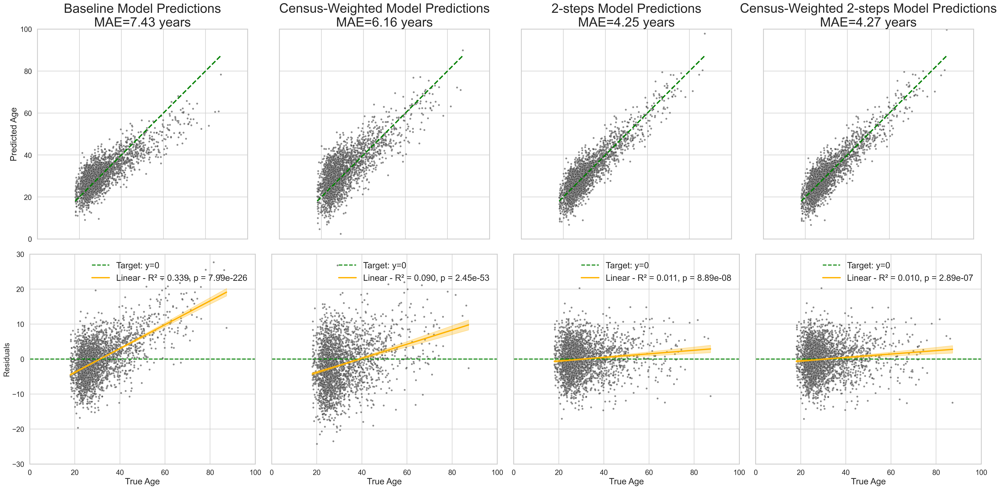

In [20]:
# plot actual vs predicted for all of the models
# plot residuals vs age for all of the models
from statsmodels.formula.api import ols
import statsmodels.api as sm

keys_vis = {
    "baseline": "Baseline Model",
    "weighted": "Census-Weighted Model",
    "linear_ph": "2-steps Model",
    "quadratic_ph": "Quadratic Post-hoc",
    "combined": "Census-Weighted 2-steps Model",
}

title_fontsize = 30
rest_fontsize = 20

nmodels = len(weighting_predictions)
fig, axes = plt.subplots(2, nmodels, figsize=(8 * nmodels, 16), sharey=False, sharex=True)
for i, (key, df) in enumerate(weighting_predictions.items()):
    ax = axes[0, i]
    sns.scatterplot(data=df, x="True", y="Predicted", ax=ax, s=20, color=COL_REF, alpha=0.6)
    ax.set_title(
        f"{keys_vis[key]} Predictions\nMAE={weighting_df.loc[key, 'MAE_weighted']:.2f} years", fontsize=title_fontsize
    )
    ax.set_aspect("equal")
    ax.set_xlabel("")
    ax.plot(
        [df["True"].min(), df["True"].max()],
        [df["True"].min(), df["True"].max()],
        color="green",
        linestyle="--",
        lw=3,
    )
    ax.set_xlim(0, 100)
    ax.set_ylim(0, 100)
    if i == 0:
        ax.set_ylabel("Predicted Age", fontsize=rest_fontsize)
    else:
        ax.set_ylabel("")
        # remove y-axis tick labels
        ax.set_yticklabels([])


for i, (key, df) in enumerate(weighting_predictions.items()):
    ax = axes[1, i]
    if "ph" in key:
        y_col = "corrected_residuals"
    else:
        df["raw_residuals"] = df["True"] - df["Predicted"]
        y_col = "raw_residuals"
    df = df.rename(columns={"True": "age_at_scan"})
    sns.scatterplot(data=df, x="age_at_scan", y=y_col, ax=ax, s=20, color=COL_REF, alpha=0.6)

    # estimate linear and quadratic fit between residuals and age
    lin_m = ols(f"{y_col} ~ age_at_scan", data=df).fit()
    poly_m = ols(f"{y_col} ~ age_at_scan + I(age_at_scan ** 2)", data=df).fit()
    # draw the "target": y = 0 line
    ax.axhline(0, color="green", linestyle="--", label="Target: y=0")
    # plot the linear fit
    x_vals = np.linspace(df["age_at_scan"].min(), df["age_at_scan"].max(), 300)
    x_frame = pd.DataFrame({"age_at_scan": x_vals})
    # find the p-value for the linear fit
    p_value = lin_m.f_pvalue
    # For visualisation, find the p < {something} value
    p_vis = f"{p_value:.2e}" if p_value < 0.001 else f"{p_value:.3f}"
    lin_label = f"Linear - R² = {lin_m.rsquared_adj:.3f}, p = {p_vis}"
    # get predictions with CI
    lin_predictions = lin_m.get_prediction(x_frame)
    lin_predictions = lin_predictions.summary_frame(alpha=0.05)
    # plot the linear fit with confidence intervals
    ax.plot(x_vals, lin_m.predict(x_frame), color=COL_RAW, label=lin_label, lw=3)
    ax.fill_between(
        x_vals,
        lin_predictions["mean_ci_lower"],
        lin_predictions["mean_ci_upper"],
        color=COL_RAW,
        alpha=0.3,
    )
    # plot the quadratic fit
    # poly_label = f"Quadratic - R² = {poly_m.rsquared:.2f}, AIC = {poly_m.aic:.1f}"
    # get predictions with CI
    # poly_predictions = poly_m.get_prediction(x_frame)
    # poly_predictions = poly_predictions.summary_frame(alpha=0.05)
    # plot the quadratic fit with confidence intervals
    # ax.plot(
    #     x_vals, poly_m.predict(x_frame), color=COL_WEIGHTED, label=poly_label, lw=3
    # )
    # ax.fill_between(
    #     x_vals,
    #     poly_predictions["mean_ci_lower"],
    #     poly_predictions["mean_ci_upper"],
    #     color=COL_WEIGHTED, alpha=0.3
    # )
    # ax.set_title(f"{keys_vis[key]} Residuals\nMAE={weighting_df.loc[key, 'MAE_weighted']:.2f} years")
    ax.legend(frameon=False, loc="upper right", fontsize=rest_fontsize)

    ax.set_xlabel("True Age", fontsize=rest_fontsize)
    if i == 0:
        ax.set_ylabel("Residuals")
    else:
        ax.set_ylabel("")
        # remove y-axis tick labels
        ax.set_yticklabels([])
    ax.set_ylim(-30, 30)

    # ax.set_xlim(df["age_at_scan"].min(), df["age_at_scan"].max())
    # ax.legend(frameon=False)
plt.tight_layout()
savefig_nice(
    fig,
    OUTPUT_DIR / f"fig3_weighted_predictions_{metric}.png",
    tight=True,
    dpi=300,
)
# savefig_nice(
#     fig,
#     OUTPUT_DIR / "global_efficiency.png",
#     tight=True,
#     dpi=300,
# )

In [21]:
vis_predictions = {k:v for k,v in weighting_predictions.items() if k in ["baseline","linear_ph"]}
# weighting_predictions.keys()

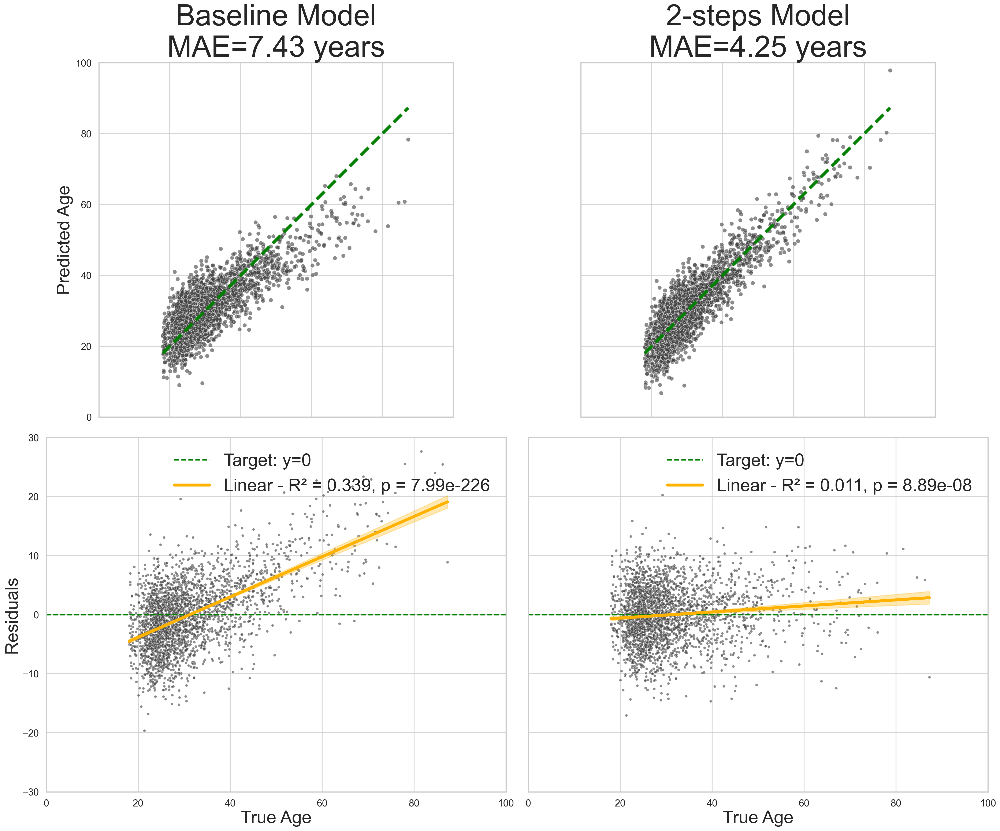

In [22]:
# plot actual vs predicted for all of the models
# plot residuals vs age for all of the models
from statsmodels.formula.api import ols
import statsmodels.api as sm

keys_vis = {
    "baseline": "Baseline Model",
    "weighted": "Census-Weighted Model",
    "linear_ph": "2-steps Model",
    "quadratic_ph": "Quadratic Post-hoc",
    "combined": "Census-Weighted 2-steps Model",
}

title_fontsize = 50
rest_fontsize = 30

nmodels = len(vis_predictions)
fig, axes = plt.subplots(2, nmodels, figsize=(12 * nmodels, 20), sharey=False, sharex=True)
for i, (key, df) in enumerate(vis_predictions.items()):
    ax = axes[0, i]
    sns.scatterplot(data=df, x="True", y="Predicted", ax=ax, s=50, color=COL_REF, alpha=0.6)
    ax.set_title(
        f"{keys_vis[key]}\nMAE={weighting_df.loc[key, 'MAE_weighted']:.2f} years",
        fontsize=title_fontsize,
    )
    ax.set_aspect("equal")
    ax.set_xlabel("")
    ax.plot(
        [df["True"].min(), df["True"].max()],
        [df["True"].min(), df["True"].max()],
        color="green",
        linestyle="--",
        lw=5,
    )
    ax.set_xlim(0, 100)
    ax.set_ylim(0, 100)
    if i == 0:
        ax.set_ylabel("Predicted Age", fontsize=rest_fontsize)
    else:
        ax.set_ylabel("")
        # remove y-axis tick labels
        ax.set_yticklabels([])


for i, (key, df) in enumerate(vis_predictions.items()):
    ax = axes[1, i]
    if "ph" in key:
        y_col = "corrected_residuals"
    else:
        df["raw_residuals"] = df["True"] - df["Predicted"]
        y_col = "raw_residuals"
    df = df.rename(columns={"True": "age_at_scan"})
    sns.scatterplot(data=df, x="age_at_scan", y=y_col, ax=ax, s=20, color=COL_REF, alpha=0.6)

    # estimate linear and quadratic fit between residuals and age
    lin_m = ols(f"{y_col} ~ age_at_scan", data=df).fit()
    poly_m = ols(f"{y_col} ~ age_at_scan + I(age_at_scan ** 2)", data=df).fit()
    # draw the "target": y = 0 line
    ax.axhline(0, color="green", linestyle="--", label="Target: y=0")
    # plot the linear fit
    x_vals = np.linspace(df["age_at_scan"].min(), df["age_at_scan"].max(), 300)
    x_frame = pd.DataFrame({"age_at_scan": x_vals})
    # find the p-value for the linear fit
    p_value = lin_m.f_pvalue
    # For visualisation, find the p < {something} value
    p_vis = f"{p_value:.2e}" if p_value < 0.001 else f"{p_value:.3f}"
    lin_label = f"Linear - R² = {lin_m.rsquared_adj:.3f}, p = {p_vis}"
    # get predictions with CI
    lin_predictions = lin_m.get_prediction(x_frame)
    lin_predictions = lin_predictions.summary_frame(alpha=0.05)
    # plot the linear fit with confidence intervals
    ax.plot(x_vals, lin_m.predict(x_frame), color=COL_RAW, label=lin_label, lw=5)
    ax.fill_between(
        x_vals,
        lin_predictions["mean_ci_lower"],
        lin_predictions["mean_ci_upper"],
        color=COL_RAW,
        alpha=0.3,
    )
    # plot the quadratic fit
    # poly_label = f"Quadratic - R² = {poly_m.rsquared:.2f}, AIC = {poly_m.aic:.1f}"
    # get predictions with CI
    # poly_predictions = poly_m.get_prediction(x_frame)
    # poly_predictions = poly_predictions.summary_frame(alpha=0.05)
    # plot the quadratic fit with confidence intervals
    # ax.plot(
    #     x_vals, poly_m.predict(x_frame), color=COL_WEIGHTED, label=poly_label, lw=3
    # )
    # ax.fill_between(
    #     x_vals,
    #     poly_predictions["mean_ci_lower"],
    #     poly_predictions["mean_ci_upper"],
    #     color=COL_WEIGHTED, alpha=0.3
    # )
    # ax.set_title(f"{keys_vis[key]} Residuals\nMAE={weighting_df.loc[key, 'MAE_weighted']:.2f} years")
    ax.legend(frameon=False, loc="upper right", fontsize=rest_fontsize)

    ax.set_xlabel("True Age", fontsize=rest_fontsize)
    if i == 0:
        ax.set_ylabel("Residuals", fontsize=rest_fontsize)
    else:
        ax.set_ylabel("")
        # remove y-axis tick labels
        ax.set_yticklabels([])
    ax.set_ylim(-30, 30)

    # ax.set_xlim(df["age_at_scan"].min(), df["age_at_scan"].max())
    # ax.legend(frameon=False)
plt.tight_layout()
savefig_nice(
    fig,
    OUTPUT_DIR / f"fig3_weighted_predictions_{metric}.png",
    tight=True,
    dpi=300,
)
# savefig_nice(
#     fig,
#     OUTPUT_DIR / "global_efficiency.png",
#     tight=True,
#     dpi=300,
# )

In [23]:
import numpy as np, pandas as pd
from sklearn.linear_model import RidgeCV, ElasticNetCV
from sklearn.model_selection import KFold, cross_val_predict
from sklearn.metrics import r2_score, mean_absolute_error, root_mean_squared_error
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

alphas = np.logspace(-3, 4, 30)  # ridge λ grid

outer_cv = KFold(
    n_splits=5,
    shuffle=True,
    random_state=1,
)

perf_rows = []

use_weights = False
# do_post_hoc_correction = True
post_hoc_degree = 1
apply_correction = True

predictions = {}

for metric, X in X_dict.items():
    # Optionally concatenate covariates
    covariates = cov_names[metric]
    if cov_names:
        X_model = np.hstack([X, cov[covariates].to_numpy()])
    else:
        X_model = X
    # y_pred = stratified_regression_cv(X_model, y, w, n_splits=10, n_bins=10)
    cur_estimator = BiasCorrectedRegressor(
        base_estimator=estimator,
        apply_correction=apply_correction,
        # use_weights=use_weights,
        # cv=outer_cv
        )

    # # Model & CV (same ridge code as before)
    model = Pipeline(
        [
            ("scaler", scaler),
            ("estimator", cur_estimator),
        ]
    )
    model.fit(X_model, y, estimator__sample_weight=w if use_weights else None)
    # y_pred = model.predict(X_model, **{"y_chron": y} if apply_correction else {})
    y_pred = manual_cross_val_predict(
        model=model,
        X=X_model,
        y=y,
        cv=outer_cv,
        sample_weight=w if use_weights else None,
        apply_correction=apply_correction,
    )
    residuals = y - y_pred
    predictions_df = cov.copy()
    predictions_df["True"] = y
    predictions_df["Predicted"] = y_pred
    # predictions_df["raw_residuals"] = original_residuals
    predictions_df["corrected_residuals"] = residuals
    predictions[metric] = predictions_df
    perf_rows.append(
        dict(
            metric=metric,
            # R2=r2_score(y, y_pred, sample_weight=w if use_weights else None),
            # MAE=mean_absolute_error(y, y_pred, sample_weight=w if use_weights else None),
            # RMSE=root_mean_squared_error(y, y_pred, sample_weight=w if use_weights else None),
            R2=r2_score(y, y_pred),
            R2_weighted=r2_score(y, y_pred, sample_weight=w),
            MAE=mean_absolute_error(y, y_pred),
            MAE_weighted=mean_absolute_error(y, y_pred, sample_weight=w),
            RMSE=root_mean_squared_error(y, y_pred),
            RMSE_weighted=root_mean_squared_error(y, y_pred, sample_weight=w),
        )
    )
    # y_pred, original_residuals, corrected_residuals = cross_val_predict_with_bias_correction(
    #     model=model,
    #     X=X_model,
    #     y_chronological=y,
    #     w=w,
    #     cv=outer_cv,
    #     use_weights=use_weights,
    #     post_hoc_degree=post_hoc_degree,
    #     # residual_orthog_degree=post_hoc_degree,
    # )

    # y_pred = cross_val_predict(
    #     model,
    #     X_model,
    #     y,
    #     # groups=age_strata(y),
    #     cv=outer_cv,
    #     params={"estimator__sample_weight": w if use_weights else None},
    #     n_jobs=-1,
    # )
    # if do_post_hoc_correction:
    #     resid = y - y_pred
    #     z = np.polyfit(y, resid, 2)
    #     p = np.poly1d(z)
    #     y_pred = y_pred + p(y)
    # # Save predictions
    
    # break

3.65579921586688
0.7771065964155398


(0.0, 100.0)

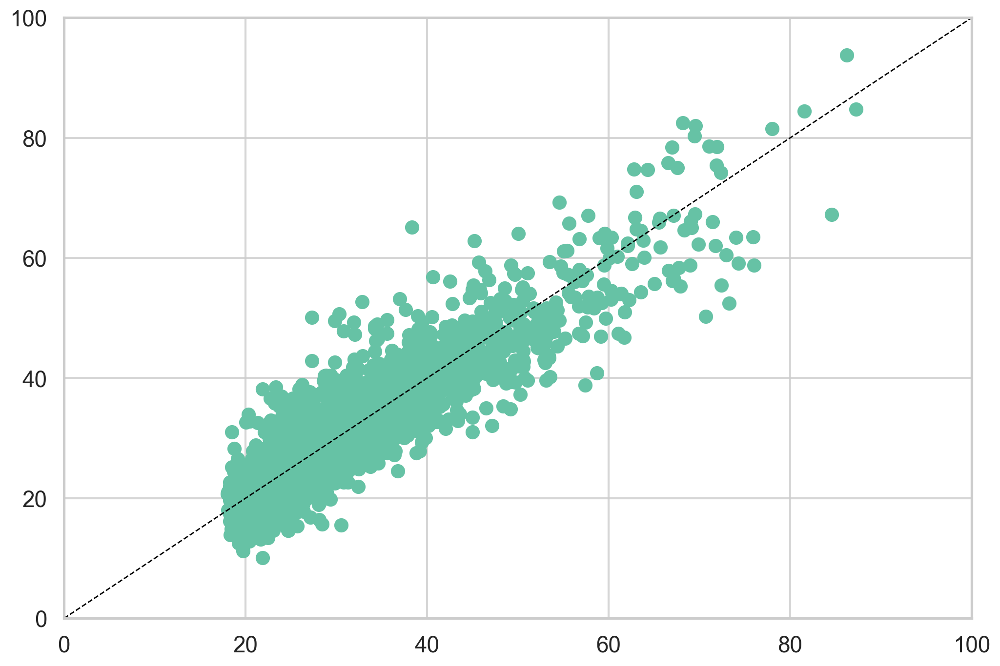

In [24]:
print(mean_absolute_error(y, y_pred, sample_weight=w if use_weights else None))
print(r2_score(y, y_pred, sample_weight=w if use_weights else None))
plt.scatter(y, y_pred)
plt.plot([0, 100], [0, 100], color="black", linestyle="--", linewidth=1)
plt.xlim(0, 100)
plt.ylim(0, 100)

In [25]:
from scipy.stats import spearmanr

spearmanr(predictions["gm_vol"]["True"], predictions["gm_vol"]["corrected_residuals"])

SignificanceResult(statistic=np.float64(0.09046254875334703), pvalue=np.float64(6.205625911748532e-06))

In [26]:
pd.DataFrame(perf_rows).set_index("metric").sort_values("MAE_weighted", ascending=True)

,R2,R2_weighted,MAE,MAE_weighted,RMSE,RMSE_weighted
metric,,,,,,
wm_vol,0.781549,0.919672,3.777628,4.228371,4.768252,5.295193
gm_vol,0.771547,0.920150,3.891753,4.252487,4.876192,5.279425
fa,0.787901,0.888577,3.617013,4.693031,4.698412,6.236441
ad,0.781546,0.891261,3.592078,4.693807,4.768290,6.160851
adc,0.776799,0.885081,3.637389,4.776305,4.819820,6.333522
csf_vol,0.778048,0.880088,3.658541,4.926785,4.806310,6.469638
rd,0.777107,0.874396,3.655799,4.948502,4.816493,6.621401


In [27]:
# ### ----------- Concatenate all metrics into one model ----------- ###
# from sklearn.pipeline import make_pipeline

# X_concat = np.hstack([X_dict[m] for m in metrics])  # already row-aligned
# # add covariates
# covariates = pd.concat([cov[cov_names[m]] for m in metrics], axis=1)
# # drop duplicate columns
# covariates = covariates.loc[:, ~covariates.columns.duplicated()].to_numpy()
# X_concat = np.hstack([X_concat, covariates])

# pipe = Pipeline(
#     [
#         ("scaler", scaler),
#         ("estimator", estimator),
#     ]
# )
# y_pred, original_residuals, corrected_residuals = cross_val_predict_with_bias_correction(
#     model=pipe,
#     X=X_concat,
#     y_chronological=y,
#     w=w,
#     cv=outer_cv,
#     use_weights=use_weights,
#     post_hoc_degree=post_hoc_degree,
#     # residual_orthog_degree=post_hoc_degree,
# )

# # if do_post_hoc_correction:
# #     resid = y - y_pred
# #     z = np.polyfit(y, resid, 2)
# #     p = np.poly1d(z)
# #     y_pred = y_pred + p(y)
# # # Save predictions
# predictions_df = cov.copy()
# predictions_df["True"] = y
# predictions_df["Predicted"] = y_pred
# predictions_df["raw_residuals"] = original_residuals
# predictions_df["corrected_residuals"] = corrected_residuals
# predictions["concatenated"] = predictions_df
# perf_rows.append(
#     dict(
#         metric="concatenated",
#         R2=r2_score(y, y_pred),
#         R2_weighted=r2_score(y, y_pred, sample_weight=w),
#         MAE=mean_absolute_error(y, y_pred),
#         MAE_weighted=mean_absolute_error(y, y_pred, sample_weight=w),
#         RMSE=root_mean_squared_error(y, y_pred),
#         RMSE_weighted=root_mean_squared_error(y, y_pred, sample_weight=w),
#     )
# )

In [28]:
# polynomial features
from sklearn.preprocessing import PolynomialFeatures
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
# ---------------------------------------------------------------------
# 2. Parcel-wise base-learner loop
# ---------------------------------------------------------------------
stacked_models = parcels.copy()

stacked_estimators = {}
predictions["base_stacked"] = {}

alphas = np.logspace(-3, 4, 30)  # ridge grid
for i, row in parcels.iterrows():  # i == parcel index (0..453)
    # ------------- build design matrix for parcel i -----------------
    # X_roi : (n_subjects , 5 metrics)
    # X_cov = cov[cov_names["gm_vol"]].to_numpy()
    X_roi = np.hstack([X_dict[m][:, [i]] for m in metrics])
    # X_roi = np.hstack([X_roi, X_cov])  # add covariates
    cur_estimator = BiasCorrectedRegressor(
        base_estimator=estimator,
        # apply_correction=apply_correction,
        apply_correction=False,
        # use_weights=use_weights,
        # cv=outer_cv
        )
    pipe = Pipeline(
        steps=[
            ("scaler", StandardScaler()),
            # ("poly", PolynomialFeatures(degree=2)),
            ("estimator", cur_estimator),
            # ("estimator", RandomForestRegressor())
        ]
    )
    pipe.fit(X_roi, y, estimator__sample_weight=w if use_weights else None)
    y_pred = manual_cross_val_predict(
        model=pipe,
        X=X_roi,
        y=y,
        cv=outer_cv,
        sample_weight=w if use_weights else None,
        # apply_correction=apply_correction,
        apply_correction=False
    )
    # y_pred = pipe.predict(X_roi, **{"y_chron": y} if apply_correction else {})
    residuals = y - y_pred
    # ---------------- fit model & predict --------------------------
    # y_pred, original_residuals, corrected_residuals = cross_val_predict_with_bias_correction(
    #     model=pipe,
    #     X=X_roi,
    #     y_chronological=y,
    #     w=w,
    #     cv=outer_cv,
    #     use_weights=use_weights,
    #     post_hoc_degree=0,
    #     # residual_orthog_degree=post_hoc_degree,
    # )

    # ---------------- store predictions & metrics -------------------
    pred_df = cov.copy()
    pred_df["True"] = y
    pred_df["Predicted"] = y_pred
    # pred_df["raw_residuals"] = original_residuals
    pred_df["corrected_residuals"] = residuals
    predictions["base_stacked"][i] = pred_df
    r2 = r2_score(y, y_pred)
    mae = mean_absolute_error(y, y_pred)
    rmse = root_mean_squared_error(y, y_pred)
    r2_weighted = r2_score(y, y_pred, sample_weight=w)
    mae_weighted = mean_absolute_error(y, y_pred, sample_weight=w)
    rmse_weighted = root_mean_squared_error(y, y_pred, sample_weight=w)

    stacked_models.loc[
        i, ["R2", "MAE", "RMSE", "R2_weighted", "MAE_weighted", "RMSE_weighted"]
    ] = [r2, mae, rmse, r2_weighted, mae_weighted, rmse_weighted]
    stacked_estimators[i] = pipe
    # if i == 428:
    #     break

/home/galkepler/Projects/neuroaging/venv/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/home/galkepler/Projects/neuroaging/venv/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/home/galkepler/Projects/neuroaging/venv/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/home/galk

<Axes: >

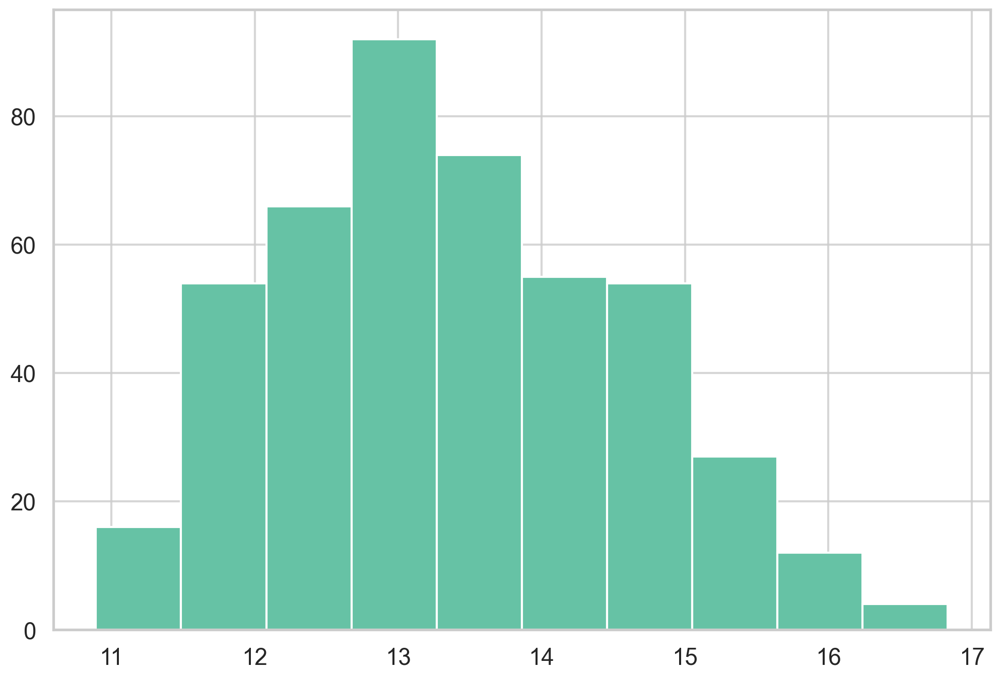

In [29]:
stacked_models["MAE_weighted"].hist()
# plt.scatter(y,y_pred)
# stacked_models.sort_values("MAE_weighted", ascending=True)

In [30]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import RidgeCV
from sklearn.metrics import (
    r2_score,
    mean_absolute_error,
    mean_squared_error,
)

# ------------------------------------------------------------------
# 1.  Build the meta-feature matrix  (n_subj × n_parcels [+ covariates])
# ------------------------------------------------------------------
# stack parcel OOF columns → shape (454, n_subj) → transpose
X_cov = cov[cov_names["gm_vol"]].to_numpy()
X_stacked = np.vstack(
    [predictions["base_stacked"][i]["Predicted"].to_numpy() for i in predictions["base_stacked"]]
).T  # (n_subj, n_parcels)

# Optionally add covariates (e.g., sex, TIV)
X_stacked = np.hstack([X_stacked, X_cov])  # (n_subj, n_parcels + n_covariates)

# ------------------------------------------------------------------
# 2.  Meta-learner pipeline (standardised ridge with CV on λ)
# ------------------------------------------------------------------
cur_estimator = BiasCorrectedRegressor(
        base_estimator=estimator,
        apply_correction=apply_correction,
        # use_weights=use_weights,
        # cv=outer_cv
        )
pipe = Pipeline(
    steps=[
        ("scaler", StandardScaler()),
        ("estimator", cur_estimator),
    ]
)
pipe.fit(X_stacked, y, estimator__sample_weight=w if use_weights else None)
# y_pred = pipe.predict(X_stacked, **{"y_chron": y} if apply_correction else {})
y_pred = manual_cross_val_predict(
        model=pipe,
        X=X_stacked,
        y=y,
        cv=outer_cv,
        sample_weight=w if use_weights else None,
        apply_correction=apply_correction,
    )
residuals = y - y_pred
# ------------------------------------------------------------------
# 3.  Out-of-fold meta predictions with fold-wise bias correction
# ------------------------------------------------------------------
# y_pred, original_residuals, corrected_residuals = cross_val_predict_with_bias_correction(
#     model=pipe,
#     X=X_stacked,
#     y_chronological=y,
#     w=w,
#     cv=outer_cv,
#     use_weights=use_weights,
#     post_hoc_degree=post_hoc_degree,
#     # residual_orthog_degree=post_hoc_degree,
# )

# ------------------------------------------------------------------
# 4.  Store predictions and performance
# ------------------------------------------------------------------
pred_df = cov.copy()
pred_df["True"] = y
pred_df["Predicted"] = y_pred
# pred_df["raw_residuals"] = original_residuals
pred_df["corrected_residuals"] = residuals
predictions["stacked"] = pred_df


perf_rows.append(
    dict(
        metric="stacked",
        R2=r2_score(y, y_pred),
        R2_weighted=r2_score(y, y_pred, sample_weight=w),
        MAE=mean_absolute_error(y, y_pred),
        MAE_weighted=mean_absolute_error(y, y_pred, sample_weight=w),
        RMSE=root_mean_squared_error(y, y_pred),
        RMSE_weighted=root_mean_squared_error(y, y_pred, sample_weight=w),
    )
)

In [31]:
dict(
    metric="stacked",
    R2=r2_score(y, y_pred),
    R2_weighted=r2_score(y, y_pred, sample_weight=w),
    MAE=mean_absolute_error(y, y_pred),
    MAE_weighted=mean_absolute_error(y, y_pred, sample_weight=w),
    RMSE=root_mean_squared_error(y, y_pred),
    RMSE_weighted=root_mean_squared_error(y, y_pred, sample_weight=w),
)

{'metric': 'stacked',
 'R2': 0.8165845083794414,
 'R2_weighted': 0.9178698966783067,
 'MAE': 3.3665002909612576,
 'MAE_weighted': 4.166255469674283,
 'RMSE': 4.36918406083043,
 'RMSE_weighted': 5.354267016796663}

In [67]:
m = "MAE"
perf_df = pd.DataFrame(perf_rows).set_index("metric").sort_values(m, ascending=True)

In [68]:
perf_df["is_best"] = perf_df[m] == perf_df[m].min()
# set is_best == False to gray and True to green (use RGB colors)
perf_df["color"] = perf_df["is_best"].map({True: "green", False: "gray"})

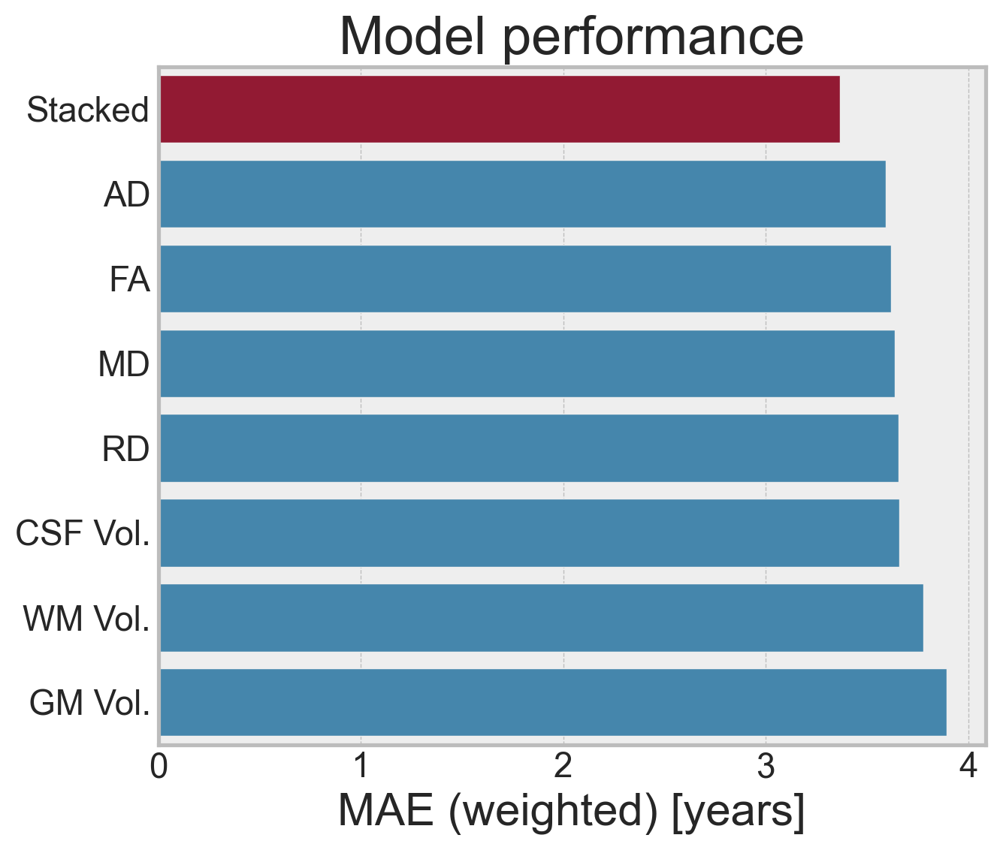

In [69]:
# -----------------------------------------------------------
# 2.  barplot with 95 % BCa bootstrap CIs on R²
# -----------------------------------------------------------
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.utils import resample

ticks_mapping = {
    "gm_vol": "GM Vol.",
    "wm_vol": "WM Vol.",
    "csf_vol": "CSF Vol.",
    "rd": "RD",
    "fa": "FA",
    "ad": "AD",
    "adc": "MD",
    "stacked": "Stacked",
}

fig, ax = plt.subplots(figsize=(7, 6))
sns.barplot(
    y="metric", x=m, data=perf_df.reset_index(), ax=ax, orient="h", hue="is_best",legend=False
)
# ax.errorbar(
#     x=np.arange(len(perf_df)),
#     y=perf_df["RMSE"],
#     # yerr=[perf_df["R2"] - ci_lo, ci_hi - perf_df["R2"]],
#     fmt="none",

#     capsize=4,
#     color="k",
#     lw=1,
# )
# change the y-ticks to the metric names
ax.set_yticks(np.arange(len(perf_df)))
ax.set_yticklabels([ticks_mapping.get(m, m) for m in perf_df.index])
# ax.set_ylabel("$R^{2}$  (10× CV, bias-corrected)")
ax.set_xlabel("MAE (weighted) [years]")
ax.set_ylabel("")
ax.set_title("Model performance")
# ax.set_xticks(np.arange(0, 1.1, 0.1))
# ax.set_ylim(0.8, perf_df["R2"].max() * 1.15)
plt.tight_layout()
# ax.set_xlim(3,6)
# plt.savefig("metric_comparison_bias_corrected.png", dpi=400)
plt.show()

In [70]:
best_metric = perf_df.index[0]
# best_metric = "gm_vol"
y = predictions[best_metric]["True"].to_numpy()
y_pred = predictions[best_metric]["Predicted"].to_numpy()
# w = predictions[best_metric]["weight"].to_numpy()
df_vis = (
    predictions[best_metric][["True", "Predicted"]]
    .copy()
    .rename(columns={"True": "age", "Predicted": "predicted"})
)

df_vis["residuals"] = df_vis["age"] - df_vis["predicted"]
# # build a model to predict the residuals
# import statsmodels.api as sm
# from statsmodels.formula.api import ols
# import statsmodels.formula.api as smf

# # Fit a linear model to the residuals
# df["residuals"] = residuals
# model = ols("residuals ~ age", data=df).fit()
# # use the model to "fix" the predictions
# df["fixed_predicted"] = df["predicted"] + model.resid

/tmp/ipykernel_9888/593301731.py:23: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(
/tmp/ipykernel_9888/593301731.py:56: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(


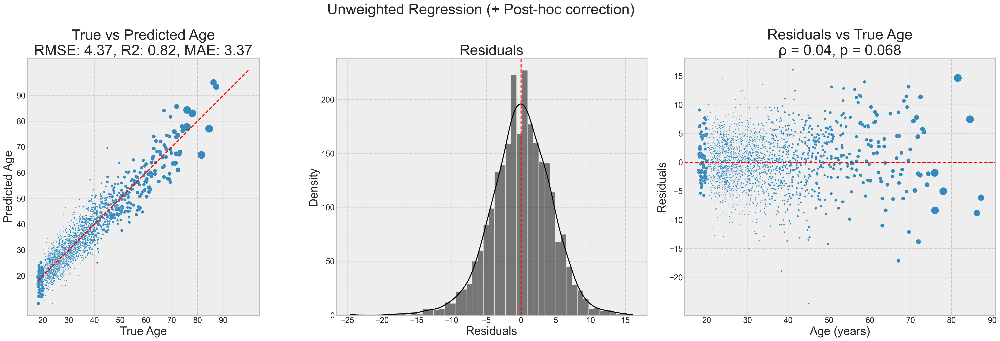

In [76]:
import seaborn as sns
from scipy.stats import pearsonr, spearmanr

plt.style.use("bmh")

do_post_hoc_correction = True
use_weights = False

r2 = r2_score(y, y_pred, sample_weight=w if use_weights else None)
rmse = root_mean_squared_error(y, y_pred, sample_weight=w if use_weights else None)
mae = mean_absolute_error(y, y_pred, sample_weight=w if use_weights else None)

# r2 = r2_score(y, y_pred)
# rmse = root_mean_squared_error(y, y_pred)
# mae = mean_absolute_error(y, y_pred)


title = f"True vs Predicted Age\nRMSE: {rmse:.2f}, R2: {r2:.2f}, MAE: {mae:.2f}"

fig, axes = plt.subplots(1, 3, figsize=(30, 10))
# plot true vs predicted
ax = axes[0]
sns.scatterplot(
    data=df_vis,
    x="age",
    y="predicted",
    ax=ax,
    # cmap="jet",
    # color by weight,
    # hue=w.flatten(),
    palette="viridis",
    s=w * 10,
)
ax.plot([18, 100], [18, 100], "--", c="red")
ax.set_xlabel("True Age", fontsize=24)
ax.set_ylabel("Predicted Age", fontsize=24)
ax.set_title(title, fontsize=30)
ax.set_xticks(range(20, 100, 10))
ax.set_yticks(range(20, 100, 10))
# make axis square
ax.set_aspect("equal", "box")

# plot residuals
ax = axes[1]
sns.histplot(data=df_vis, x="residuals", ax=ax, kde=True, color="black")
ax.set_xlabel("Residuals", fontsize=24)
ax.set_ylabel("Density", fontsize=24)
ax.set_title("Residuals", fontsize=30)
ax.axvline(0, color="red", linestyle="--")

# plot residuals vs true age

r, p = spearmanr(df_vis["age"], df_vis["residuals"])

ax = axes[2]
sns.scatterplot(
    data=df_vis,
    x="age",
    y="residuals",
    ax=ax,
    # cmap="jet",
    # color by weight,
    # hue=w.flatten(),
    palette="viridis",
    s=w * 10,
)
ax.axhline(0, color="red", linestyle="--")
ax.set_xlabel("Age (years)", fontsize=24)
ax.set_ylabel("Residuals", fontsize=24)
ax.set_title("Residuals vs True Age\nρ = {:.2f}, p = {:.2g}".format(r, p), fontsize=30)
ax.set_xticks(range(20, 100, 10))
ax.set_yticks(range(-20, 20, 5))
# make axis square

suptitle = "Weighted Regression" if use_weights else "Unweighted Regression"
if do_post_hoc_correction:
    suptitle += " (+ Post-hoc correction)"
fig.suptitle(suptitle, fontsize=30)

plt.tight_layout()

/tmp/ipykernel_9888/3480182499.py:24: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(
/tmp/ipykernel_9888/3480182499.py:57: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(


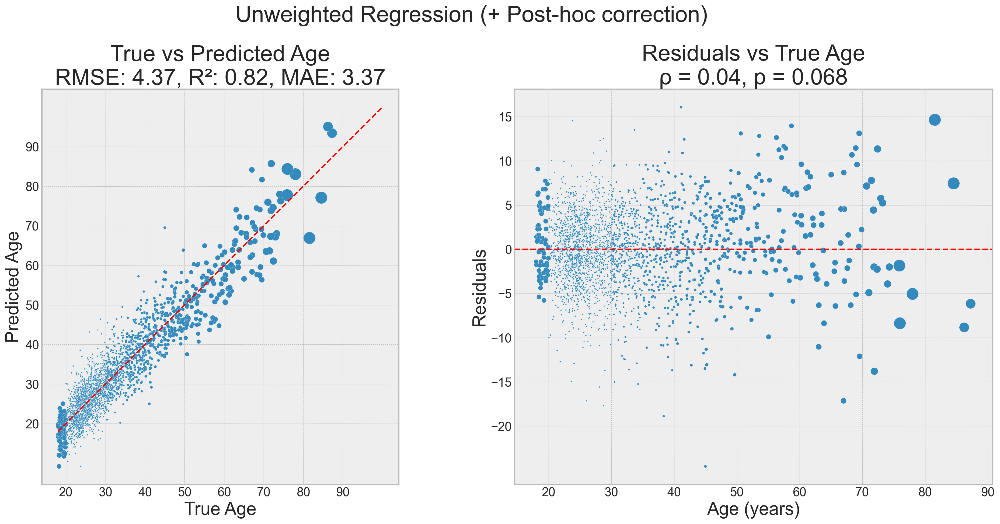

In [38]:
import seaborn as sns
from scipy.stats import pearsonr, spearmanr

plt.style.use("bmh")

do_post_hoc_correction = True
use_weights = False

r2 = r2_score(y, y_pred, sample_weight=w if use_weights else None)
rmse = root_mean_squared_error(y, y_pred, sample_weight=w if use_weights else None)
mae = mean_absolute_error(y, y_pred, sample_weight=w if use_weights else None)

# r2 = r2_score(y, y_pred)
# rmse = root_mean_squared_error(y, y_pred)
# mae = mean_absolute_error(y, y_pred)


# title = f"True vs Predicted Age\nRMSE: {rmse:.2f}, R2: {r2:.2f}, MAE: {mae:.2f}"
title = f"True vs Predicted Age\nRMSE: {rmse:.2f}, R²: {r2:.2f}, MAE: {mae:.2f}"

fig, axes = plt.subplots(1, 2, figsize=(20, 10))
# plot true vs predicted
ax = axes[0]
sns.scatterplot(
    data=df_vis,
    x="age",
    y="predicted",
    ax=ax,
    # cmap="jet",
    # color by weight,
    # hue=w.flatten(),
    palette="viridis",
    s=w * 10,
)
ax.plot([18, 100], [18, 100], "--", c="red")
ax.set_xlabel("True Age", fontsize=24)
ax.set_ylabel("Predicted Age", fontsize=24)
ax.set_title(title, fontsize=30)
ax.set_xticks(range(20, 100, 10))
ax.set_yticks(range(20, 100, 10))
# make axis square
ax.set_aspect("equal", "box")

# plot residuals
# ax = axes[1]
# sns.histplot(data=df, x="residuals", ax=ax, kde=True, color="black")
# ax.set_xlabel("Residuals", fontsize=24)
# ax.set_ylabel("Density", fontsize=24)
# ax.set_title("Residuals", fontsize=30)
# ax.axvline(0, color="red", linestyle="--")

# plot residuals vs true age

r, p = spearmanr(df_vis["age"], df_vis["residuals"])

ax = axes[1]
sns.scatterplot(
    data=df_vis,
    x="age",
    y="residuals",
    ax=ax,
    # cmap="jet",
    # color by weight,
    # hue=w.flatten(),
    palette="viridis",
    s=w * 10,
)
ax.axhline(0, color="red", linestyle="--")
ax.set_xlabel("Age (years)", fontsize=24)
ax.set_ylabel("Residuals", fontsize=24)
ax.set_title("Residuals vs True Age\nρ = {:.2f}, p = {:.2g}".format(r, p), fontsize=30)
ax.set_xticks(range(20, 100, 10))
ax.set_yticks(range(-20, 20, 5))
# make axis square

suptitle = "Weighted Regression" if use_weights else "Unweighted Regression"
if do_post_hoc_correction:
    suptitle += " (+ Post-hoc correction)"
fig.suptitle(suptitle, fontsize=30)

plt.tight_layout()

In [133]:
df_cov = pd.read_csv("~/Projects/plasticityhub/sessions.csv")
df_cov = df_cov.drop_duplicates(subset=["subject_code"]).set_index("subject_code")
# df_cov = pd.read_pickle(f"/media/storage/phd/papers/aging/{ATLAS}/gm_vol.pkl").reset_index(
#     drop=True
# )
# df_cov = pd.read_csv("~/Projects/plasticityhub/sessions.csv")
# df_cov = pd.read_csv("qV1v.csv")

# finished_subjects = (
#     pd.read_csv("/media/storage/phd/papers/aging/schaefer2018tian2020_400_7/subjects.csv")
#     .values.flatten()
#     .tolist()
# )
# df_cov = df_cov[df_cov["Subject Code"].isin(finished_subjects)]

# df_cov = df_cov.groupby("subject_code").first()
df = df_cov.merge(df_vis, left_on="subject_code", right_index=True, how="inner")
# merge with cov
# df_cov = df_cov.merge(cov, left_on="subject_code", right_index=True, how="inner")
df["BMI"] = df["weight"] / ((df["height"]/100) ** 2)





# exercise_frequency_mapping = {
#     "פעמיים-שלוש בשבוע": 2.5,
#     "1-1": 1.5,
#     "יותר מ-3 פעמים בשבוע": 4,
# }
# df_cov["exercise_frequency"] = df_cov["exercise_frequency"].map(
#     exercise_frequency_mapping
# )
df["number_of_children"] = df["number_of_children"].fillna(0)

education_level_mapping = {
    "elementary school": 1,
    "partial high school": 2,
    "high_school": 3,
    "post-secondary": 4,
    "undergraduate": 5,
    "bachelor's degree": 6,
    "U": np.nan,
    # "other": np.nan,
}
df["education_level"] = df["education_level"].map(education_level_mapping)

for col in ['blood_sugar', 'blood_pressure', 'thyroids', 'lipids']:
    df[col] = df[col].str.lower().map({
        "high": 1,
        "normal": 0,
        "low": -1,
        "very low": -2,
        "very high": 2,
    })


In [152]:
df["religion_degree"].dropna()

subject_code
0009                    Secular
0072                    Secular
0417                    Secular
0437                    Secular
0470                    Secular
                   ...         
BB01325                 Secular
BB01332                 Secular
BB01353    Prefer not to answer
BB01333             Traditional
BB01297             Traditional
Name: religion_degree, Length: 356, dtype: object

In [198]:
target = "residuals"
# Categories from analysis
categories = {
    'continuous': ['age_at_scan', 'weight', 'relationship_duration', 'number_of_children', 'number_of_siblings', 'b5_extraversion', 'b5_agreeableness', 'b5_conscientiousness', 'b5_emotional_stability', 'b5_openness', 'hli', 'swls', 'BMI', 'salary', "years_in_residence"],
    'ordinal': ['education_level', 'sibling_order', 'psqi', 'oasis', 'pcl5', 'gad7', 'phq9','blood_sugar', 'blood_pressure', 'thyroids', 'lipids'],
    'categorical': ['sex', 'handedness', 'gender', 'sexual_orientation', 'living_environment', 'marital_status', 'ethnic_identity', 'political_orientation', 'religion', 'religion_degree', 'family_history', 'severe_health_conditions', 'major_health_conditions', 'minor_health_conditions', 'brain_health', 'depression', 'anxiety', 'communication_disorders', 'attention_disorders', 'visual_aid', 'hearing_aid', 'long_covid'],
    'other': ['subject_id', 'session_id', 'path', 'version', 'years_in_residence', 'twins']
}

# Key measures to prioritize
key_measures = ['BMI', 'psqi', 'relationship_duration',"religion_degree","sexual_orientation","living_environment","marital_status","visual_aid"]

vars_to_check = [target] + key_measures


In [223]:
from sklearn.cross_decomposition import CCA
from sklearn.preprocessing import StandardScaler
# Target (BAG)
target = 'residuals'

# Key behavioral measures for Set 2
key_measures = [
    'BMI',
    # 'relationship_duration',
    "religion_degree",
    "sexual_orientation",
    "living_environment",
     "marital_status",
     "psqi",
     "oasis",
     "pcl5",
     "sex",
     "anxiety",
     "depression",
     "communication_disorders",
     "attention_disorders",
]

# Encode categorical
df_encoded = pd.get_dummies(df.replace({"U": np.nan}).dropna(subset=key_measures)[key_measures], drop_first=True)


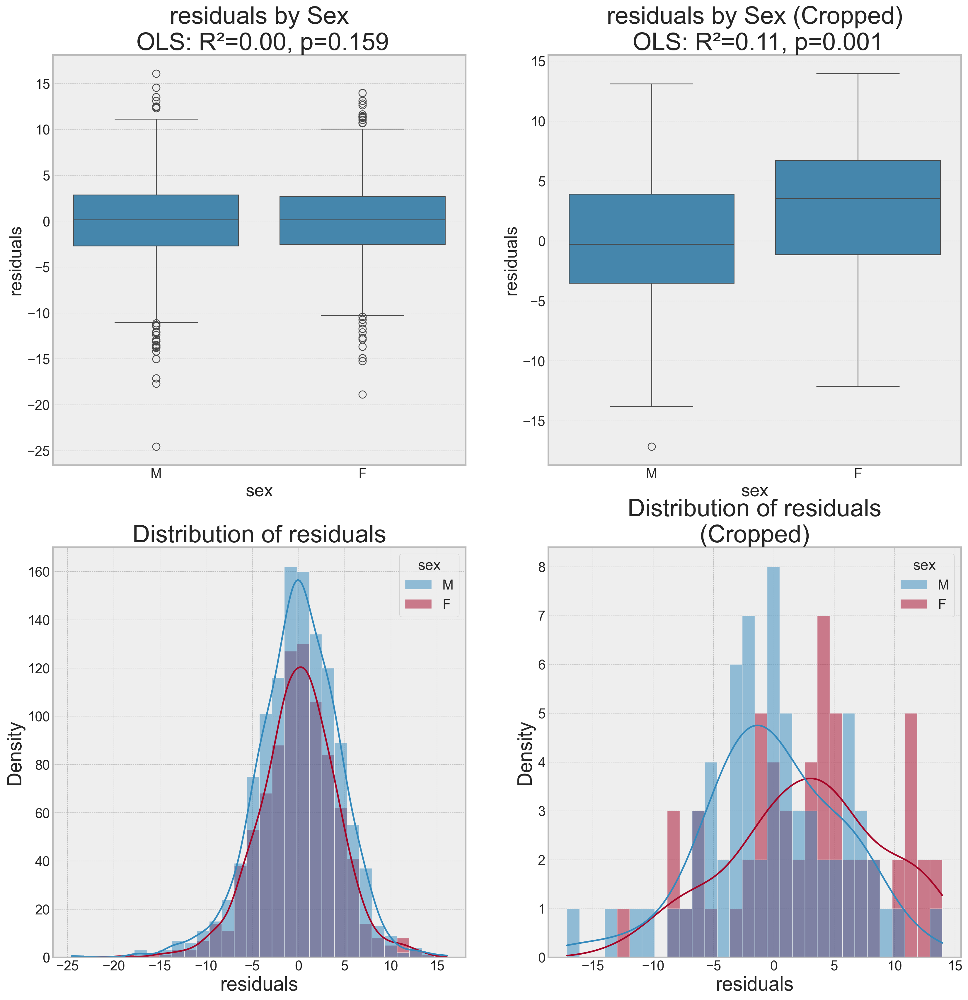

In [182]:
from scipy import stats
fig,axes = plt.subplots(2, 2, figsize=(20, 20))
# first row - boxplot with OLS regression line
for cropped, ax in zip([False, True], axes[0]):
    cur_df = df.copy() if not cropped else df[df["age_at_scan"] > 50]
    res = ols(f"{target} ~ age_at_scan + C(sex)", data=cur_df).fit()
    
    sns.boxplot(
        data=cur_df,
        x="sex",
        y=target,
        ax=ax
    )
    title = f"{target} by Sex"
    if cropped:
        title += " (Cropped)"
    title += f"\n OLS: R²={res.rsquared:.2f}, p={res.f_pvalue:.3f}"
    ax.set_title(title, fontsize=30)

# second row - distribution of target variable
for cropped, ax in zip([False, True], axes[1]):
    cur_df = df.copy() if not cropped else df[df["age_at_scan"] > 50]
    sns.histplot(
        data=cur_df,
        x=target,
        hue="sex",
        ax=ax,
        kde=True,
        # color="black",
        bins=30
    )
    title = f"Distribution of {target}"
    if cropped:
        title += "\n(Cropped)"
    ax.set_title(title, fontsize=30)
    ax.set_xlabel(target, fontsize=24)
    ax.set_ylabel("Density", fontsize=24)



In [330]:
x_col = 'BMI'

# split fv_cov into groups where each group has 50 subjects, going from the younger to the older subjects
def split_into_groups(df, group_size=50):
    df = df.sort_values("age", ascending=False)
    groups = [df.iloc[i:i + group_size] for i in range(0, len(df), group_size)]
    ages = [group["age"].median() for group in groups]
    return ages, groups

df_test = df[df[x_col].notna()]

ages, groups = split_into_groups(df_test)

bins_df = pd.DataFrame(columns=["median_age","group_size", "min_age", "max_age", f"{x_col}_median", "residuals_median", "r","p"])

for i, (age, group) in enumerate(zip(ages, groups)):
    bins_df.loc[i, "median_age"] = age
    bins_df.loc[i, "group_size"] = len(group)
    bins_df.loc[i, "min_age"] = group["age"].min()
    bins_df.loc[i, "max_age"] = group["age"].max()
    # bins_df.loc[i, f"{x_col}_median"] = group[x_col].median()
    bins_df.loc[i, "residuals_median"] = group["residuals"].median()
    # plot the distribution of the x_col in this group
    cur_y = group[x_col].dropna()
    cur_x = group["residuals"].loc[cur_y.index]
    res = ols(f"{target} ~ age_at_scan + {x_col}", data=group).fit()
    # bins_df.loc[i, "t"] = res.tvalues["C(sex)[T.M]"]
    # bins_df.loc[i, "p"] = res.pvalues["C(sex)[T.M]"]
    # bins_df.loc[i, "t"] = res.tvalues["C(communication_disorders)[T.True]"]
    # bins_df.loc[i, "p"] = res.pvalues["C(communication_disorders)[T.True]"]
    bins_df.loc[i, "beta"] = res.params[x_col]
    bins_df.loc[i, "p"] = res.pvalues[x_col]



# correlation between quadratic median age and Spearman's ρ
model = ols("beta ~ median_age", data=bins_df.astype(float)).fit()
model.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   beta   R-squared:                       0.219
Model:                            OLS   Adj. R-squared:                  0.200
Method:                 Least Squares   F-statistic:                     11.22
Date:                Mon, 21 Jul 2025   Prob (F-statistic):            0.00177
Time:                        16:17:52   Log-Likelihood:                 22.739
No. Observations:                  42   AIC:                            -41.48
Df Residuals:                      40   BIC:                            -38.00
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.1398      0.071      1.981      0.054      -0.003       0.282
median_age    -0.0073      0.002     -3.350      0.002      -0.012      -0.003
==============================================================================
Omnibus:                        1.970   Durbin-Watson:                   2.022
Prob(Omnibus):                  0.373   Jarque-Bera (JB):                1.506
Skew:                          -0.464   Prob(JB):                        0.471
Kurtosis:                       2.967   Cond. No.                         102.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [362]:
df.columns

Index(['subject_id', 'dob', 'age_at_scan', 'sex', 'session_id', 'study',
       'group', 'condition', 'path', 'weight', 'height', 'version',
       'handedness', 'gender', 'sexual_orientation', 'living_environment',
       'years_in_residence', 'marital_status', 'relationship_duration',
       'number_of_children', 'number_of_siblings', 'sibling_order', 'twins',
       'ethnic_identity', 'political_orientation', 'religion',
       'religion_degree', 'family_history', 'blood_sugar', 'blood_pressure',
       'thyroids', 'lipids', 'severe_health_conditions',
       'major_health_conditions', 'minor_health_conditions', 'brain_health',
       'depression', 'anxiety', 'communication_disorders',
       'attention_disorders', 'visual_aid', 'hearing_aid', 'psqi',
       'long_covid', 'oasis', 'pcl5', 'gad7', 'phq9', 'b5_extraversion',
       'b5_agreeableness', 'b5_conscientiousness', 'b5_emotional_stability',
       'b5_openness', 'hli', 'swls', 'education_level', 'salary', 'age',
       'pred

In [421]:
# import pandas as pd
# import statsmodels.api as sm
# from statsmodels.formula.api import ols
# from sklearn.utils import resample

# def rolling_window_analysis(df, x_col='BMI', target='residuals', group_size=100, step=10):
#     """
#     Perform rolling window analysis on sorted age data.
    
#     Sorts df by age ascending, then slides overlapping windows of size group_size with step.
#     For each window, fits OLS: target ~ age_at_scan + x_col (or C(x_col) if binary).
#     Extracts beta/p for x_col (single value for continuous/binary).
    
#     Parameters:
#     - df: DataFrame with 'age', 'age_at_scan', target, x_col.
#     - x_col: Predictor column (e.g., 'BMI').
#     - target: Dependent variable (e.g., 'residuals').
#     - group_size: Window size (default 100).
#     - step: Step for overlapping windows (default 10; smaller = more overlap).
    
#     Returns:
#     - bins_df: DataFrame with per-window stats.
#     - model_summary: Summary of beta ~ median_age OLS (if beta is scalar).
#     """
#     # Filter NaN in x_col and sort by age ascending
#     df_test = df[df[x_col].notna()].copy()
#     df_test = df_test.sort_values("age", ascending=True).reset_index(drop=True)

#     # Initialize results DF
#     bins_df = pd.DataFrame(columns=["median_age", "group_size", "min_age", "max_age", "residuals_median", "beta", "p"])

#     # Rolling windows loop
#     for i in range(0, len(df_test) - group_size + 1, step):
#         group = df_test.iloc[i:i + group_size]
#         age = group["age"].median()
        
#         row_idx = len(bins_df)
#         bins_df.loc[row_idx, "median_age"] = age
#         bins_df.loc[row_idx, "group_size"] = len(group)
#         bins_df.loc[row_idx, "min_age"] = group["age"].min()
#         bins_df.loc[row_idx, "max_age"] = group["age"].max()
#         bins_df.loc[row_idx, "residuals_median"] = group["residuals"].median()
        
#         # Detect if x_col is binary (exactly 2 unique values)
#         unique_vals = group[x_col].nunique()
#         is_binary = unique_vals == 2
        
#         if unique_vals > 2:
#             # print(f"Warning: x_col '{x_col}' has {unique_vals} > 2 unique values in window {row_idx}; skipping or treat as continuous.")
#             is_binary = False  # Treat as continuous
        
#         # Build formula
#         if is_binary:
#             formula = f"{target} ~ C({x_col})"
#         else:
#             formula = f"{target} ~ {x_col}"
        
#         # Fit OLS
#         betas_boot = []
#         for _ in range(1000):  # Bootstrap 100 times
#             group_boot = resample(group)
#             res_boot = ols(formula, data=group_boot).fit()
#             betas_boot.append(res_boot.params[x_col])
#         res = ols(formula, data=group).fit()
        
#         # Extract beta/p (for binary, get the treatment level beta)
#         if is_binary:
#             # Assume reference is first level; treatment param is C(x_col)[T.level]
#             treatment_param = [p for p in res.params.index if p.startswith(f'C({x_col})[T.')]
#             if treatment_param:
#                 bins_df.loc[row_idx, "beta"] = res.params[treatment_param[0]]
#                 bins_df.loc[row_idx, "p"] = res.pvalues[treatment_param[0]]
#             else:
#                 bins_df.loc[row_idx, "beta"] = np.nan
#                 bins_df.loc[row_idx, "p"] = np.nan
#         else:
#             bins_df.loc[row_idx, "beta"] = res.params[x_col]
#             bins_df.loc[row_idx, "p"] = res.pvalues[x_col]

#     # Correlation between beta and median_age (only if beta is numeric)
#     model = ols("beta ~ median_age", data=bins_df.astype(float)).fit()
#     return bins_df, model

# # Example usage (replace with your df)
# # bins_df, model = rolling_window_analysis(df_test, x_col="phq9")
# # print(model.summary())

# # Example usage (replace with your df)
# # bins_df, model = rolling_window_analysis(df_test, x_col="phq9")
# # print(model)

# # Example usage (replace with your df)
# bins_df, model = rolling_window_analysis(df_test, x_col="sex", group_size=100, step=100)
# print(model.summary())
# # bins_df

In [497]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.formula.api import ols
from sklearn.utils import resample
import statsmodels.stats.multitest as smm

def rolling_window_analysis(df, x_col='BMI', target='residuals', group_size=100, step=10, n_bootstrap=1000):
    """
    Perform rolling window analysis on sorted age data.
    
    Sorts df by age ascending, then slides overlapping windows of size group_size with step.
    For each window, fits OLS: target ~ age_at_scan + x_col (or + C(x_col) if binary) with bootstrap.
    Extracts mean beta/p for x_col (single value for continuous/binary).
    Adjusts p-values for multiple testing across windows using FDR.
    
    Parameters:
    - df: DataFrame with 'age', 'age_at_scan', target, x_col.
    - x_col: Predictor column (e.g., 'BMI').
    - target: Dependent variable (e.g., 'residuals').
    - group_size: Window size (default 100).
    - step: Step for overlapping windows (default 10; smaller = more overlap).
    - n_bootstrap: Number of bootstrap iterations (default 1000).
    
    Returns:
    - bins_df: DataFrame with per-window stats, including adjusted p.
    - model_summary: Summary of beta_mean ~ median_age OLS.
    """
    # Filter NaN in x_col and sort by age ascending
    df_test = df[df[x_col].notna()].copy()
    df_test = df_test.sort_values("age", ascending=True).reset_index(drop=True)

    # Initialize results DF
    bins_df = pd.DataFrame(columns=["median_age", "group_size", "min_age", "max_age", "residuals_median", "beta_mean", "p_mean", "beta_ci_low", "beta_ci_high", "p_ci_low", "p_ci_high"])

    # Rolling windows loop
    for i in range(0, len(df_test) - group_size + 1, step):
        group = df_test.iloc[i:i + group_size]
        age = group["age"].median()
        
        row_idx = len(bins_df)
        bins_df.loc[row_idx, "median_age"] = age
        bins_df.loc[row_idx, "group_size"] = len(group)
        bins_df.loc[row_idx, "min_age"] = group["age"].min()
        bins_df.loc[row_idx, "max_age"] = group["age"].max()
        bins_df.loc[row_idx, "residuals_median"] = group["residuals"].median()
        
        # Detect if x_col is binary (exactly 2 unique values)
        unique_vals = group[x_col].nunique()
        is_binary = unique_vals == 2
        
        if unique_vals > 2 and not pd.api.types.is_numeric_dtype(group[x_col]):
            # Skip or warn for multi-level categorical
            print(f"Warning: x_col '{x_col}' has {unique_vals} > 2 non-numeric unique values in window {row_idx}; skipping.")
            continue
        
        # Build formula
        if is_binary:
            formula = f"{target} ~ age_at_scan + C({x_col})"
        else:
            formula = f"{target} ~ age_at_scan + {x_col}"
        
        # Bootstrap
        betas_boot = []
        p_boot = []
        for _ in range(n_bootstrap):
            group_boot = resample(group)
            res_boot = ols(formula, data=group_boot).fit()
            # Extract beta/p (for binary, get the treatment level beta)
            if is_binary:
                treatment_param = [p for p in res_boot.params.index if p.startswith(f'C({x_col})[T.')]
                beta = res_boot.params[treatment_param[0]] if treatment_param else np.nan
                p_value = res_boot.pvalues[treatment_param[0]] if treatment_param else np.nan
            else:
                beta = res_boot.params[x_col]
                p_value = res_boot.pvalues[x_col]
            betas_boot.append(beta)
            p_boot.append(p_value)
        
        bins_df.loc[row_idx, "beta_mean"] = np.mean(betas_boot)
        bins_df.loc[row_idx, "beta_se"] = np.std(betas_boot)
        bins_df.loc[row_idx, "beta_median"] = np.median(betas_boot)
        bins_df.loc[row_idx, "beta_ci_low"] = np.percentile(betas_boot, 2.5)
        bins_df.loc[row_idx, "beta_ci_high"] = np.percentile(betas_boot, 97.5)
        bins_df.loc[row_idx, "p_mean"] = np.mean(p_boot)
        bins_df.loc[row_idx, "p_se"] = np.std(p_boot)
        bins_df.loc[row_idx, "p_median"] = np.median(p_boot)
        bins_df.loc[row_idx, "p_ci_low"] = np.percentile(p_boot, 2.5)
        bins_df.loc[row_idx, "p_ci_high"] = np.percentile(p_boot, 97.5)

    # Adjust p_mean for multiple testing (FDR)
    p_adjusted, _, _, _ = smm.multipletests(bins_df["p_mean"].dropna(), method='fdr_bh')
    bins_df.loc[bins_df["p_mean"].notna(), "p_adjusted"] = p_adjusted

    # Correlation between beta_mean and median_age
    model = ols("beta_mean ~ median_age", data=bins_df.astype(float)).fit()
    
    return bins_df, model, df_test

# Example usage (replace with your df)
# bins_df, model = rolling_window_analysis(df_test, x_col="phq9")
# print(model.summary())

# Example usage (replace with your df)
bins_df, model, df_test = rolling_window_analysis(df_test, x_col="BMI", group_size=100, step=10, n_bootstrap=100)
# bins_df

In [498]:
pred_df = pd.DataFrame({"median_age":np.linspace(bins_df["median_age"].min(), bins_df["median_age"].max(), 100)})

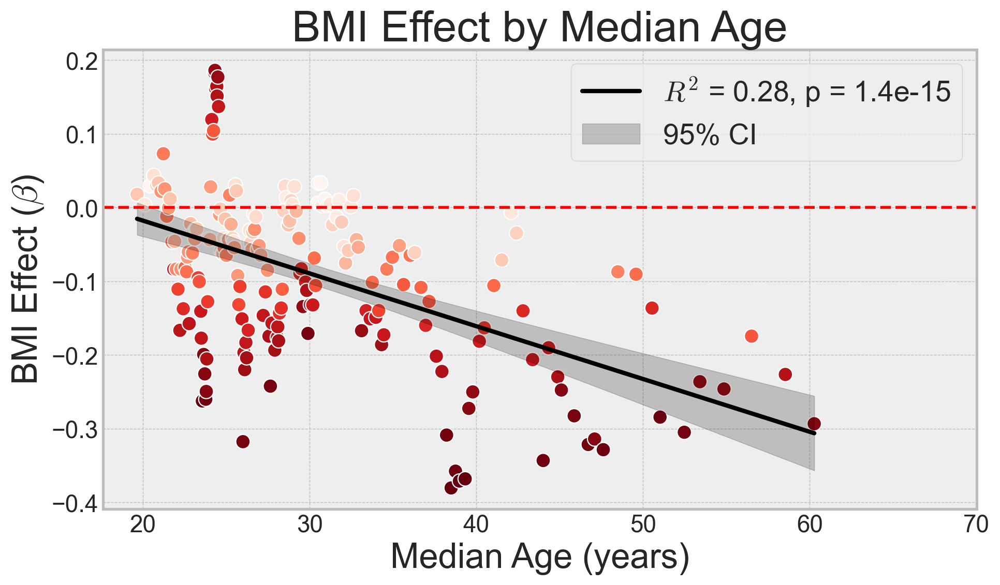

In [500]:
pr = model.get_prediction(pred_df)
ci = pr.conf_int(alpha=0.05)
pred_df["beta_fit"] = pr.predicted_mean
pred_df["beta_lo"] = ci[:,0]
pred_df["beta_hi"] = ci[:,1]

fig, ax = plt.subplots(figsize=(10, 6))
# sns.regplot(data=bins_df.astype(float), x="median_age", y="r", ax=ax, scatter=False, color="black", label="Regression Line")
sns.scatterplot(data=bins_df.astype(float), x="median_age", y="beta_mean", ax=ax, s=100, hue="p_median", palette="Reds_r",legend=False)

ax.plot(pred_df["median_age"], pred_df["beta_fit"], color="black", label=f"$R^2$ = {model.rsquared_adj:.2f}, p = {model.f_pvalue:.2g}",lw=3)
ax.fill_between(
    pred_df["median_age"],
    pred_df["beta_lo"],
    pred_df["beta_hi"],
    color="black",
    alpha=0.2,
    label="95% CI",
)
ax.legend(fontsize=20, title_fontsize=24)
ax.set_xlabel("Median Age (years)", fontsize=24)
ax.set_ylabel("BMI Effect ($\\beta$)", fontsize=24)
ax.set_title("BMI Effect by Median Age", fontsize=30)
ax.set_xticks(range(20, 80, 10))
# ax.set_yticks(np.arange(-0.3, 0.3, 0.2))
# ax.set_ylim(-0.3, 0.3)
ax.axhline(0, color="red", linestyle="--")
# ax.legend(title="p-value", fontsize=20, title_fontsize=24)
plt.tight_layout()
# savefig_nice(
# sns.regplot(data=bins_df.astype(float), x="median_age", y="r")

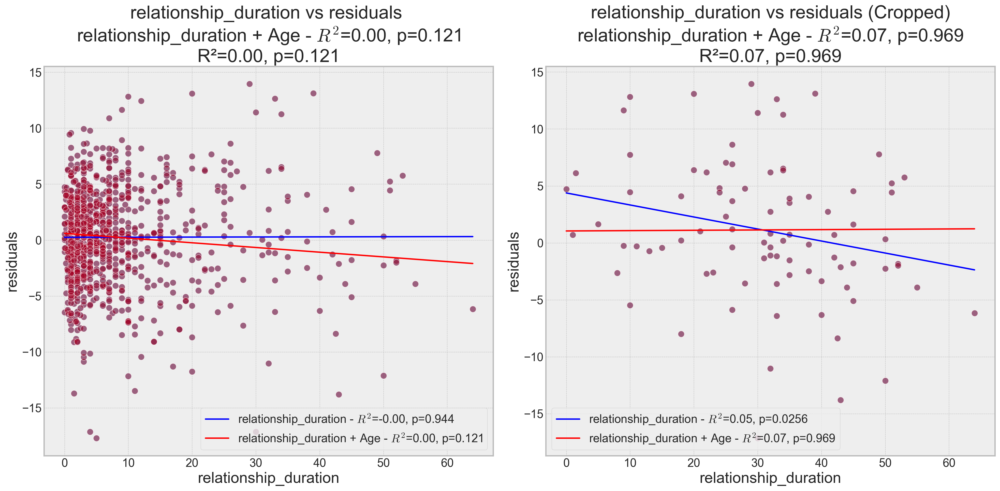

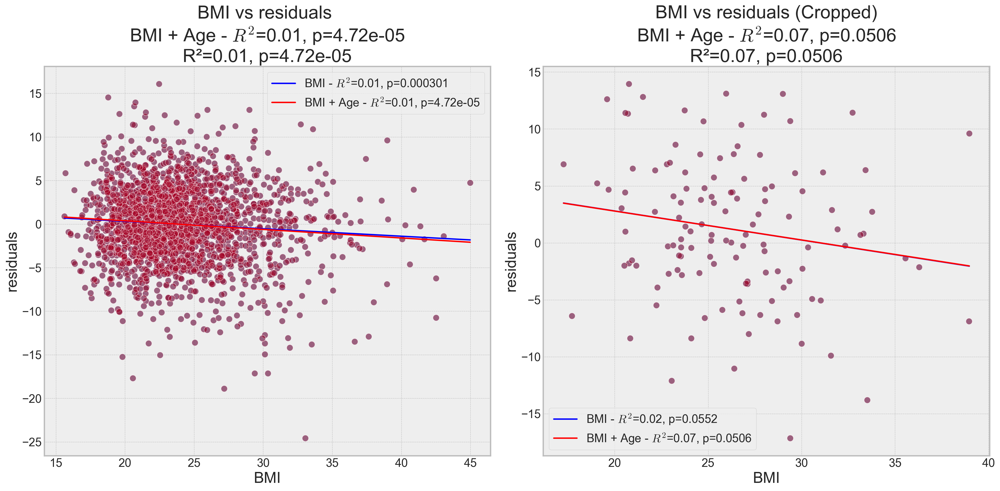

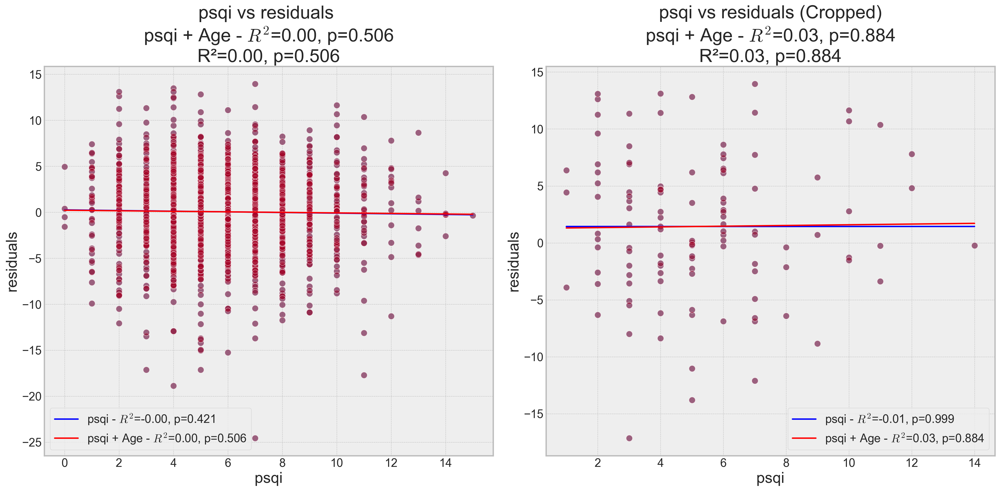

In [157]:
from scipy import stats
import pingouin as pg
from statsmodels.formula.api import ols
# Results storage
results = []

# Continuous/Ordinal: OLS with/without age correction
for col in [c for c in (categories['continuous'] + categories['ordinal']) if c in key_measures]:
    if col == 'age_at_scan' or col == 'age':  # Skip age variables
        continue
    fig, axes = plt.subplots(1,2, figsize=(20, 10))
    for crop,ax in zip([False, True], axes):
        if crop:
            cur_df = df[df['age_at_scan'] > 50] 
        else:
            cur_df = df.copy()
        # drop missing values
        cur_df = cur_df.dropna(subset=[target, col])
        if cur_df.empty:
            print(f"No data for {col} with crop={crop}")
            continue
        for include_age in [False, True]:
            if include_age:
                model = ols(f"{target} ~ {col} + age", data=cur_df).fit()
                label = f"{col} + Age - $R^2$={model.rsquared_adj:.2f}, p={model.pvalues[col]:.3g}"
            else:
                model = ols(f"{target} ~ {col}", data=cur_df).fit()
                label = f"{col} - $R^2$={model.rsquared_adj:.2f}, p={model.pvalues[col]:.3g}"
            # Get p-value and r-squared
            p_value = model.pvalues[col]
            r_squared = model.rsquared_adj
            # Store results
            results.append({
                'variable': col,
                'include_age': include_age,
                'crop': crop,
                'p_value': p_value,
                'r_squared': r_squared
            })
            
            # Plot
            sns.scatterplot(data=cur_df, x=col, y=target, ax=ax, alpha=0.5)
            xvals = np.linspace(cur_df[col].min(), cur_df[col].max(), 100)
            pred = model.predict(pd.DataFrame({col: xvals, 'age': cur_df['age_at_scan'].mean()} if include_age else {col: xvals}))
            ax.plot(xvals, pred, label=label, color='red' if include_age else 'blue', lw=2)
            ax.set_title(f"{col} vs {target} {'(Cropped)' if crop else ''}\n{label}\nR²={r_squared:.2f}, p={p_value:.3g}")
            ax.set_xlabel(col)
            ax.set_ylabel(target)
            ax.legend()
    plt.tight_layout()
        
    plt.show()
    # break


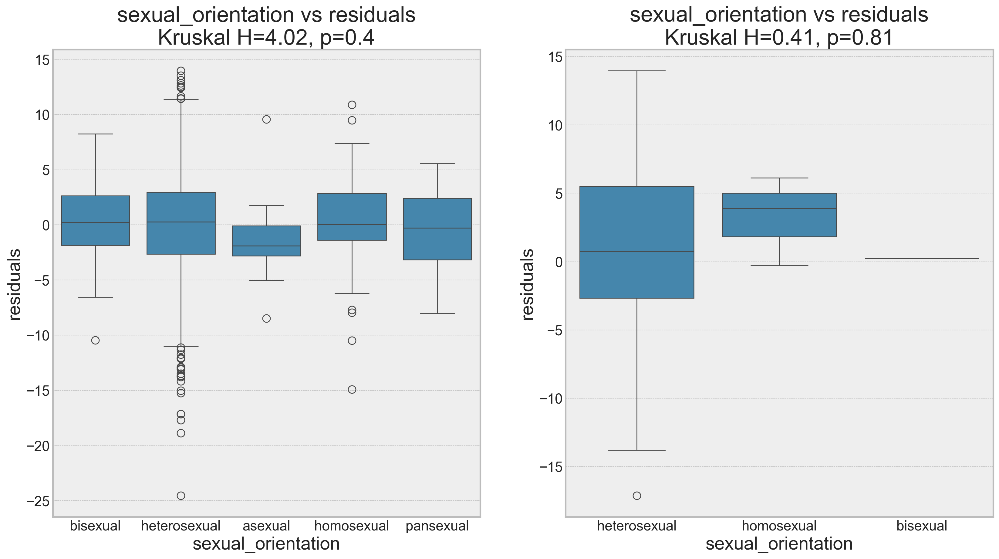

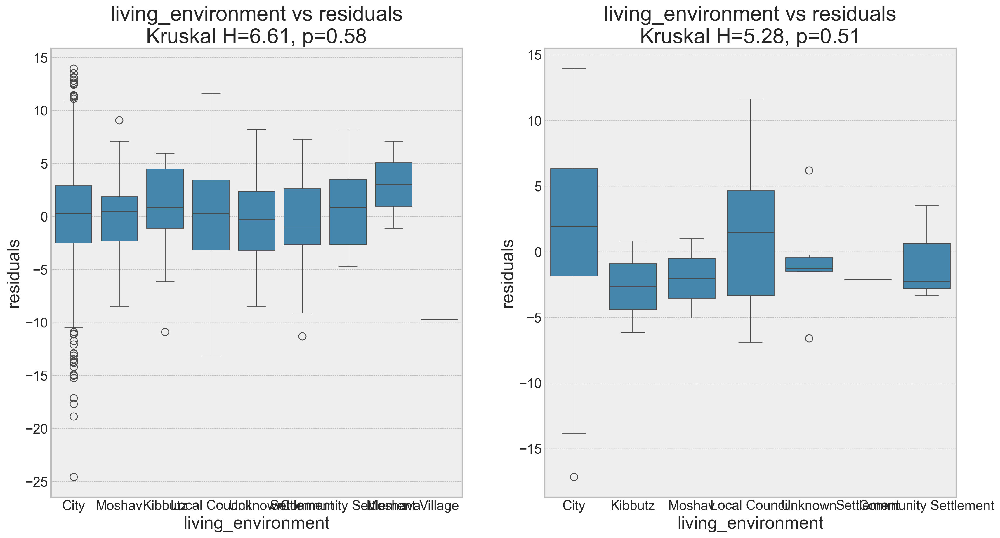

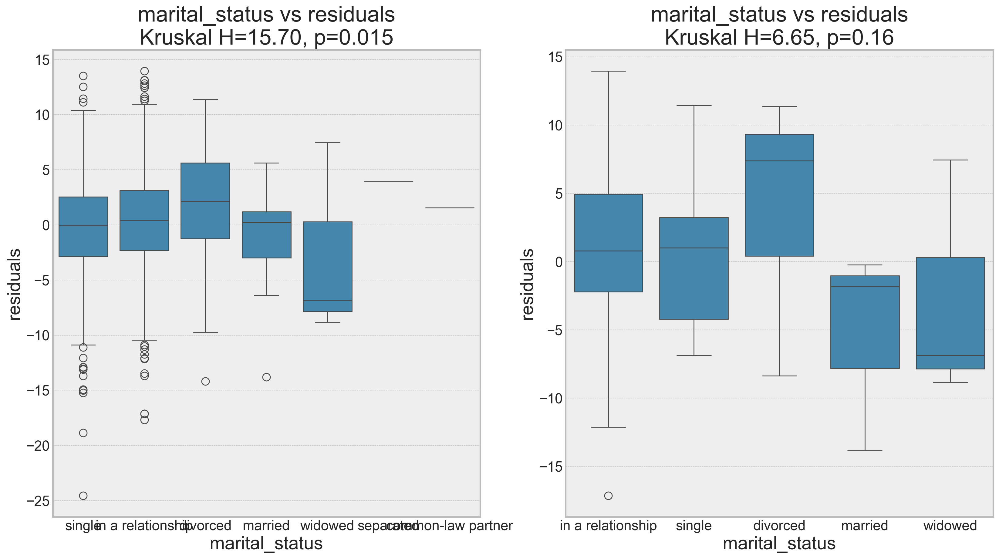

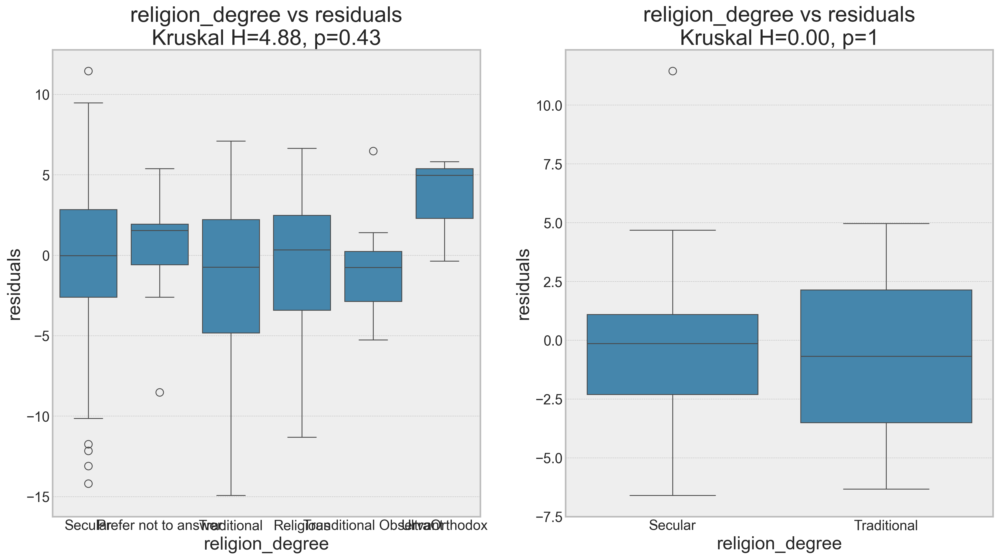

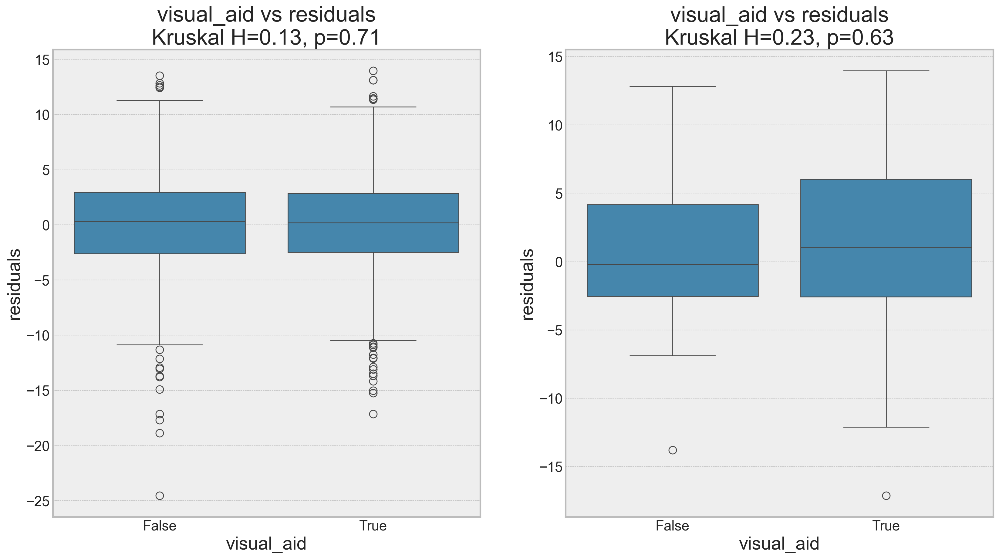

In [199]:
# Categorical: Kruskal-Wallis for group differences in BAG
for col in [c for c in categories['categorical'] if c in key_measures]:
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))
    for crop, ax in zip([False, True], axes):
        if crop:
            cur_df = df[df['age_at_scan'] > 50] 
        else:
            cur_df = df.copy()
        # drop missing values
        cur_df = cur_df[cur_df[col] != "U"]
        cur_df = cur_df.dropna(subset=[target, col])
        unique_groups = cur_df[col].unique()
        if len(unique_groups) < 2:
            continue  # Skip if only one group
        groups = [cur_df[cur_df[col] == group][target] for group in unique_groups if not cur_df[cur_df[col] == group][target].empty]
        if len(groups) < 2 or any(len(g) == 0 for g in groups):
            continue
        kruskal_stat, kruskal_p = stats.kruskal(*groups)
        results.append({
            'variable': col,
            'type': 'categorical',
            'kruskal_stat': kruskal_stat,
            'kruskal_p': kruskal_p,
            'groups': unique_groups.tolist()
        })
        
        # Visualize
        sns.boxplot(data=cur_df, x=col, y=target, ax=ax)
        ax.set_title(f"{col} vs {target}\nKruskal H={kruskal_stat:.2f}, p={kruskal_p:.2g}")
        ax.set_xlabel(col)
        ax.set_ylabel(target)
    plt.show()

In [ ]:
df_cov.to_csv("covariates.csv", index=False)

In [ ]:
from statsmodels.formula.api import ols, wls

x_col = "salary"
# x_col = "3rd_Hol_Survivor"
# cur_df_cov = df_cov[(df_cov["age"] > 50) & (df_cov[x_col].notna())]
cur_df_cov = df_cov.copy()
# cur_df_cov = cur_df_cov[cur_df_cov["sex"] == "M"]
cov_y = cur_df_cov[x_col].dropna().astype(float)
cov_x = cur_df_cov["residuals"].loc[cov_y.index]
# x = df_cov["age"].loc[y.index]
print(spearmanr(cov_x, cov_y))
print(cov_x.shape)
model = ols(f"{x_col} ~ age+residuals", data=cur_df_cov).fit()
print(model.summary())

SignificanceResult(statistic=np.float64(0.00936679877416923), pvalue=np.float64(0.7052564054964559))
(1633,)
                            OLS Regression Results                            
Dep. Variable:                 salary   R-squared:                       0.131
Model:                            OLS   Adj. R-squared:                  0.130
Method:                 Least Squares   F-statistic:                     122.4
Date:                Mon, 21 Jul 2025   Prob (F-statistic):           2.99e-50
Time:                        12:05:47   Log-Likelihood:                -17269.
No. Observations:                1633   AIC:                         3.454e+04
Df Residuals:                    1630   BIC:                         3.456e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------

In [ ]:
# df_cov.columns

In [ ]:
behav_cols = ["Neuro and psychiatric Issues","BloodSugar","PSQI","HLI","BMI","education_level"]

<Axes: xlabel='brain_health', ylabel='residuals'>

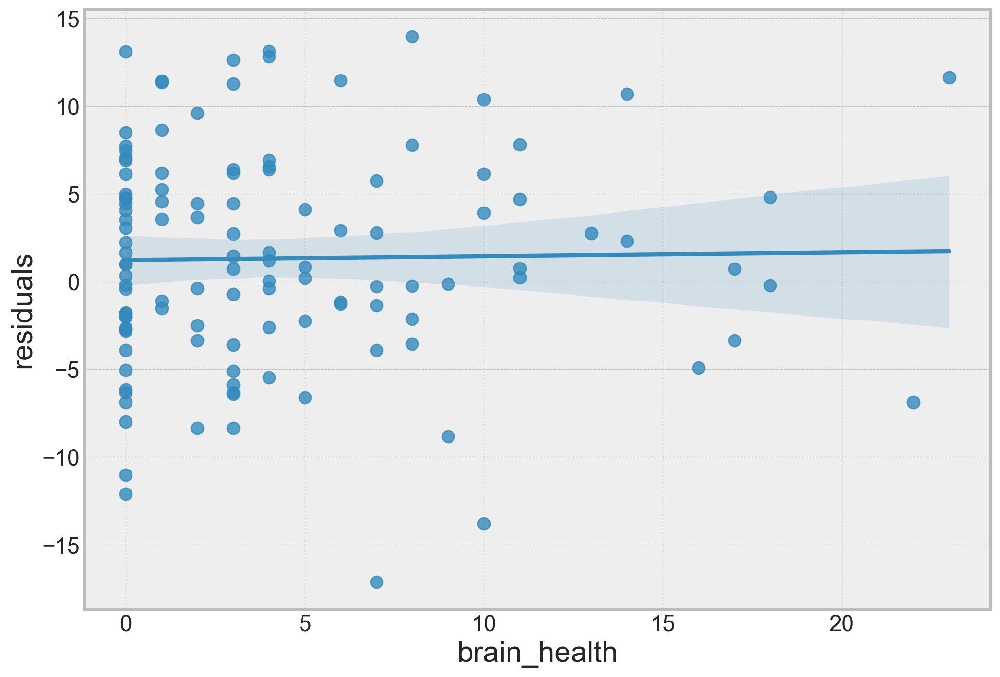

In [ ]:
sns.regplot(x=cov_y, y=cov_x)

In [ ]:
# split fv_cov into groups where each group has 50 subjects, going from the younger to the older subjects
def split_into_groups(df, group_size=50):
    df = df.sort_values("age", ascending=False)
    groups = [df.iloc[i:i + group_size] for i in range(0, len(df), group_size)]
    ages = [group["age"].median() for group in groups]
    return ages, groups

df_test = df_cov[df_cov[x_col].notna()]

ages, groups = split_into_groups(df_test)

bins_df = pd.DataFrame(columns=["median_age","group_size", "min_age", "max_age", f"{x_col}_median", "residuals_median", "r","p"])

for i, (age, group) in enumerate(zip(ages, groups)):
    bins_df.loc[i, "median_age"] = age
    bins_df.loc[i, "group_size"] = len(group)
    bins_df.loc[i, "min_age"] = group["age"].min()
    bins_df.loc[i, "max_age"] = group["age"].max()
    bins_df.loc[i, f"{x_col}_median"] = group[x_col].median()
    bins_df.loc[i, "residuals_median"] = group["residuals"].median()
    # plot the distribution of the x_col in this group
    cur_y = group[x_col].dropna().astype(float)
    cur_x = group["residuals"].loc[cur_y.index]
    # if cur_y is continuous, use spearman correlation
    # if cur_y is categorical, use point-biserial correlation
    # if cur_y is ordinal, use spearman correlation
    # if cur_y is binary, use point-biserial correlation
    if cur_y.nunique() < 10:
        # use point-biserial correlation
        from scipy.stats import pointbiserialr
        r, p = pointbiserialr(cur_x, cur_y)
    else:
        # use spearman correlation
        r, p = spearmanr(cur_x, cur_y)
        # model = ols(f"{x_col} ~ residuals", data=group).fit()
        # r = model.rsquared_adj
        # p = model.f_pvalue
    bins_df.loc[i, "r"] = r
    bins_df.loc[i, "p"] = p



# correlation between quadratic median age and Spearman's ρ
model = ols("r ~ median_age", data=bins_df.astype(float)).fit()
model.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      r   R-squared:                       0.122
Model:                            OLS   Adj. R-squared:                  0.093
Method:                 Least Squares   F-statistic:                     4.174
Date:                Sun, 20 Jul 2025   Prob (F-statistic):             0.0499
Time:                        13:25:51   Log-Likelihood:                 5.7220
No. Observations:                  32   AIC:                            -7.444
Df Residuals:                      30   BIC:                            -4.512
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.1769      0.114      1.559      0.130      -0.055       0.409
median_age    -0.0071      0.003     -2.043      0.050      -0.014      -3e-06
==============================================================================
Omnibus:                       43.203   Durbin-Watson:                   1.828
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              176.356
Skew:                           2.848   Prob(JB):                     5.07e-39
Kurtosis:                      12.991   Cond. No.                         101.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

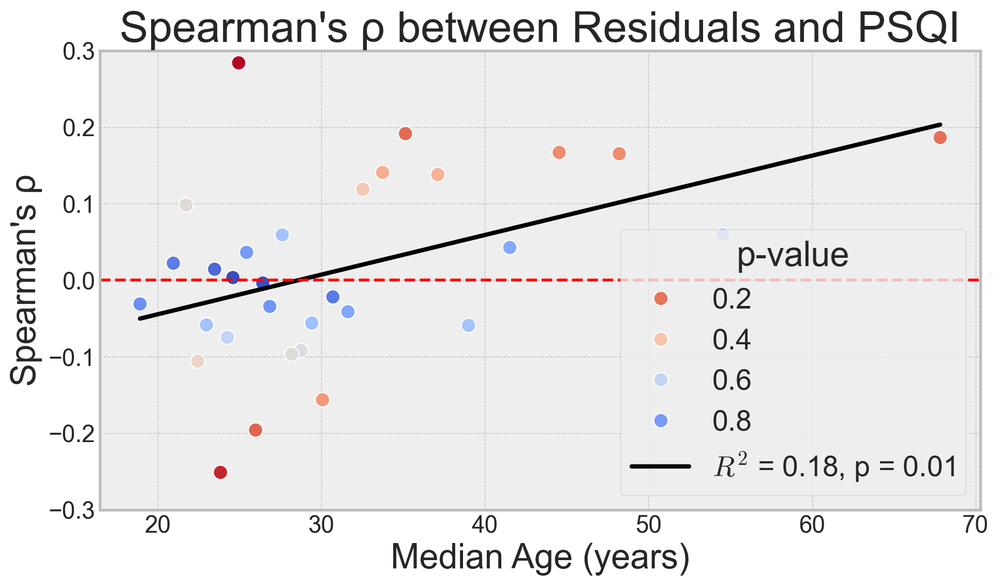

In [ ]:

pred_x = np.linspace(bins_df["median_age"].min(), bins_df["median_age"].max(), 100)
pred_df = pd.DataFrame({"median_age": pred_x})
pred_df["r"] = model.predict(pred_df)

fig, ax = plt.subplots(figsize=(10, 6))
# sns.regplot(data=bins_df.astype(float), x="median_age", y="r", ax=ax, scatter=False, color="black", label="Regression Line")
sns.scatterplot(data=bins_df.astype(float), x="median_age", y="r", ax=ax, s=100, hue="p", palette="coolwarm_r")
sns.lineplot(data=pred_df, x="median_age", y="r", ax=ax, color="black", lw=3, label=f"$R^2$ = {model.rsquared_adj:.2f}, p = {model.f_pvalue:.2g}")
ax.set_xlabel("Median Age (years)", fontsize=24)
ax.set_ylabel("Spearman's ρ", fontsize=24)
ax.set_title(f"Spearman's ρ between Residuals and {x_col}", fontsize=30)
ax.set_xticks(range(20, 80, 10))
# ax.set_yticks(np.arange(-0.3, 0.3, 0.2))
ax.set_ylim(-0.3, 0.3)
ax.axhline(0, color="red", linestyle="--")
ax.legend(title="p-value", fontsize=20, title_fontsize=24)
plt.tight_layout()
# savefig_nice(
# sns.regplot(data=bins_df.astype(float), x="median_age", y="r")

<Axes: xlabel='PSQI', ylabel='residuals'>

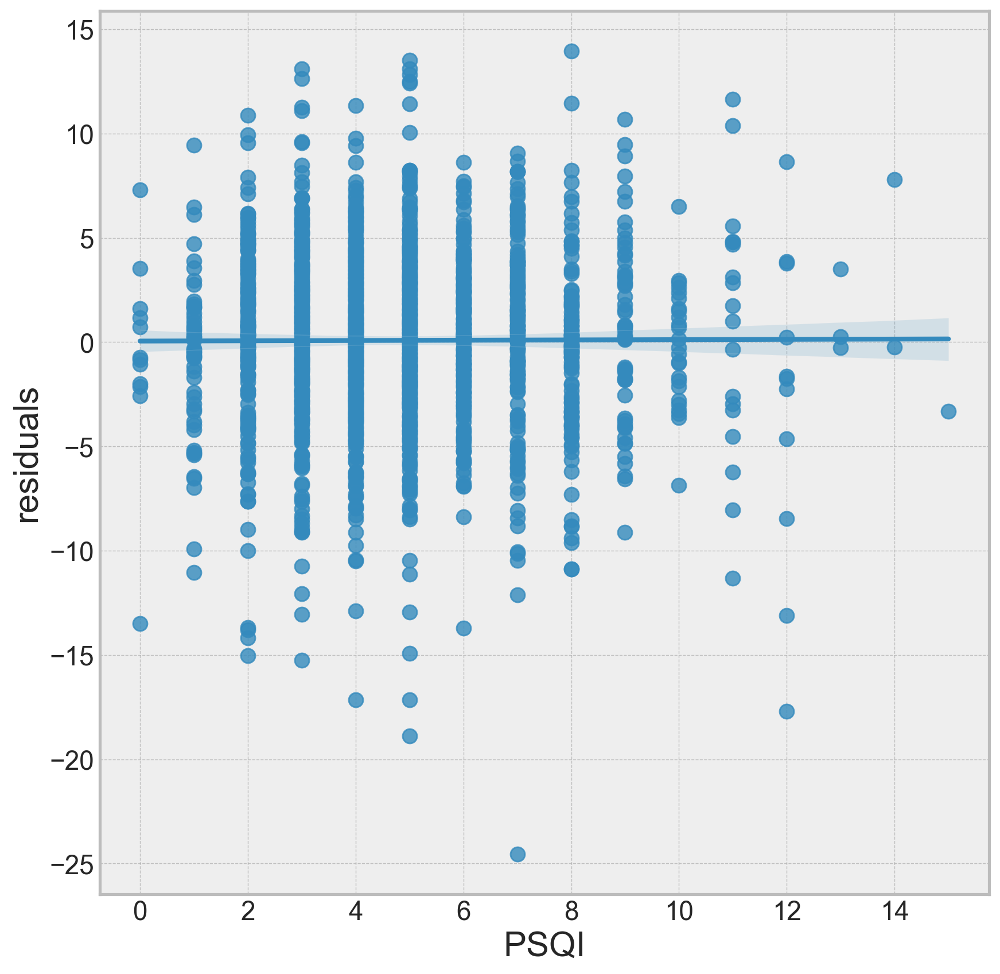

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
sns.regplot(x=y, y=x, ax=ax)